# Background and Introduction - Problem Statement

Banks earn revenue from several different tools at their disposition, some of these tools include direct investment in companies, fund management and of course, loans. One of the most important types of loans a bank makes is its personal credit card loan. This type of loan not only carries one of the largest interests charged, but it comes with several services that increase Bank's revenue even more. At Thera Bank, the business analytics team has noticed a decline in the number of users of credit cards, which is hurting business for the reasons outlined above. They have collected a set of independent variables and we will use them in conjuction with several types of models to predict whether the person will churn or not.

# Characteristics
- Since we will be applying Linear and Logistic regression, we might find that our models overfit the data and perform badly on testing sets, for this reason, we will implement regularization techniques to try and imporve the results.
- It is clear from the beginning, even without having seen the data, that we will be treating with an unbalanced set. While there are customers leaving the service, it is not the majority, and since this is the dependent varibale we want to predict, we will have to deal with class imbalances with different up and down sampling techniques.
- The objective of this study is to understand the profile of customer's who are leaving the service, that means we should be careful with False Negatives, or people predicted to not churn but in reality they do. By maximazing Recall, our models will provide us with a Cohort where those predicted to churn can then be analyzed to come up with their characteristics and allow us to imporve the bank services.Moreover, Recall is the metric of choice when dealing with imbalanced classes (although we will use some techniques that alleviate this problem). Note that since Precision tries to minimize False Positives, some of the individuals we predict to indeed leave the service, will actually stay with the bank, which could add noise to our profile analysis, F1 score could also be maximized if we find the noise to be too problematic.

In [438]:
# Import all necessary libraries
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn import tree
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 100)
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler, TomekLinks 
from sklearn.pipeline import Pipeline, make_pipeline

# Classifiers libraries
from sklearn.impute import SimpleImputer
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.linear_model import LogisticRegression

# Metrics libraries
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.metrics import accuracy_score, recall_score, precision_score, confusion_matrix, precision_recall_curve, f1_score, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn import metrics

# Preprocesing libraries
from sklearn.preprocessing import StandardScaler

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:60% !important; }</style>"))

# EDA & Variable Analysis

In [448]:
# Import dataset and convert into pandas dataframe
df = pd.read_csv('BankChurners.csv')

In [91]:
# look at random sample of rows to get general idea of distribution
np.random.seed(1)
df.sample(n=30)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
6498,712389108,Existing Customer,43,F,2,Graduate,Married,Less than $40K,Blue,36,6,3,2,2570.0,2107,463.0,0.651,4058,83,0.766,0.820
9013,718388733,Existing Customer,38,F,1,College,Unknown,Less than $40K,Blue,32,2,3,3,2609.0,1259,1350.0,0.871,8677,96,0.627,0.483
2053,710109633,Existing Customer,39,M,2,College,Married,$60K - $80K,Blue,31,6,3,2,9871.0,1061,8810.0,0.545,1683,34,0.478,0.107
3211,717331758,Existing Customer,44,M,4,Graduate,Married,$120K +,Blue,32,6,3,4,34516.0,2517,31999.0,0.765,4228,83,0.596,0.073
5559,709460883,Attrited Customer,38,F,2,Doctorate,Married,Less than $40K,Blue,28,5,2,4,1614.0,0,1614.0,0.609,2437,46,0.438,0.000
6106,789105183,Existing Customer,54,M,3,Post-Graduate,Single,$80K - $120K,Silver,42,3,1,2,34516.0,2488,32028.0,0.552,4401,87,0.776,0.072
4150,771342183,Attrited Customer,53,F,3,Graduate,Single,$40K - $60K,Blue,40,6,3,2,1625.0,0,1625.0,0.689,2314,43,0.433,0.000
2205,708174708,Existing Customer,38,M,4,Graduate,Married,$40K - $60K,Blue,27,6,2,4,5535.0,1276,4259.0,0.636,1764,38,0.900,0.231
4145,718076733,Existing Customer,43,M,1,Graduate,Single,$60K - $80K,Silver,31,4,3,3,25824.0,1170,24654.0,0.684,3101,73,0.780,0.045
5324,821889858,Attrited Customer,50,F,1,Doctorate,Single,Unknown,Blue,46,6,4,3,1970.0,1477,493.0,0.662,2493,44,0.571,0.750


- We see CLIENTNUM can be dropped since it's a primary key and holds no information
- The second thing to note is that Income_Category is not a continous variable like we usually see, instead it's made up of different income levels. We should treat this column to have more readable categories.

In [449]:
# General information about size, shape and type of variables in dataset
df.drop(columns='CLIENTNUM', inplace=True) # We will use pandas Index instead of this ID
print('Types of variables in dataframe:')
print(df.info())
print('\nShape of dataframe:')
print(df.shape)
print('\n5 Point analysis of numerical variables in dataframe:')
print(df.describe().T)
print('\nNumber of null values in dataframe:')
print(df.isnull().sum())

Types of variables in dataframe:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10

- We have 20 columns total in this dataset. As we can see, we will have to convert some of the 'objects' into categories.
- The average age of customers is 46 years old, with half of them being between 41 and 52 years old.
- We see the minimum time a customer has used the credit card service from the bank is 13 months, a little over a year, while the longest customers have been using it for over 4 and a half years.
- The average number of contracts with the bank in the past year is 2 and half, with the minimum being none besides the credit card service. We see that in the past year, the maximum number of inactive months is six, but the average for all customers is 2.3, less than half of the maximum value. Of course the minimum value is 0, which makes sense for recurrently active users.
- We see credit limit to be somewhat skewed, with 50 per cent of all customers having a limit between 2500 and 11000 but a max limit of almost 35 thousand!
- Total transactions amount shows a similar pattern, with the 25 percentile being 4000 but the max being almost 20 thousand.
- Luckily, we have no missing values, but will have to treat Income_Category as mentioned above for a more intuitive set of values.

# Categorical Variables

In [450]:
# Convert into categorical variables

for i in ['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']:
    df[i]= df[i].astype('category')

In [451]:
# Convert Income_Category into more easily readable labels by replacing existing values with our own

df['Income_Category'].replace('Less than $40K', 'I < $40K', inplace=True)
df['Income_Category'].replace('$40K - $60K', '$40K < I < $60K', inplace=True)
df['Income_Category'].replace('$60K - $80K', '$60K < I < $80K', inplace=True)
df['Income_Category'].replace('$80K - $120K', '$80K < I < $120K', inplace=True)
df['Income_Category'].replace('Unknown', 'Unknown Income', inplace=True)

In [452]:
# Simple function to plot barplot with percentage on top of bars
def percentage_plot(ax, feature):
    total = len(feature)
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total) # Get percentages from features
        x = p.get_x() + p.get_width() / 2 - 0.05 # Set location
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 15) # Set size of percentage value
    plt.show()

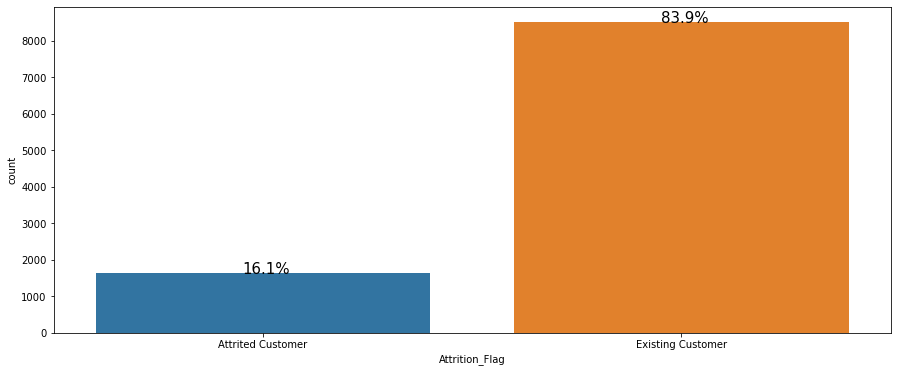

<Figure size 432x288 with 0 Axes>

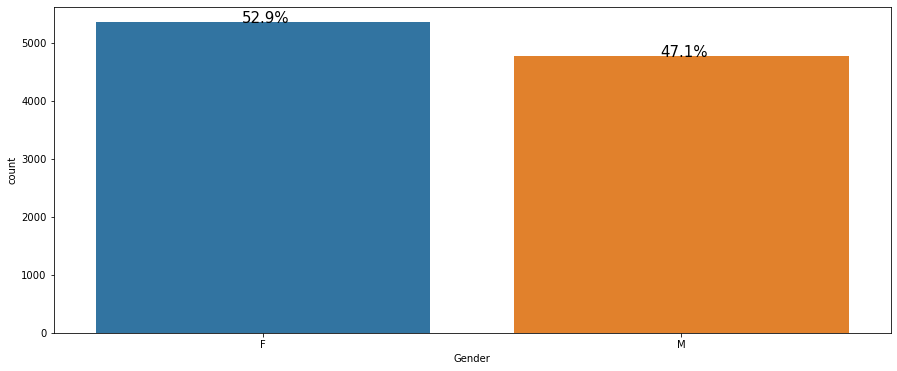

<Figure size 432x288 with 0 Axes>

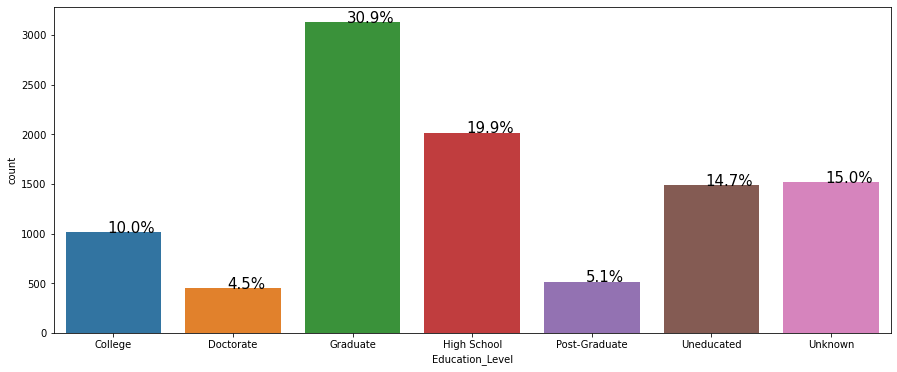

<Figure size 432x288 with 0 Axes>

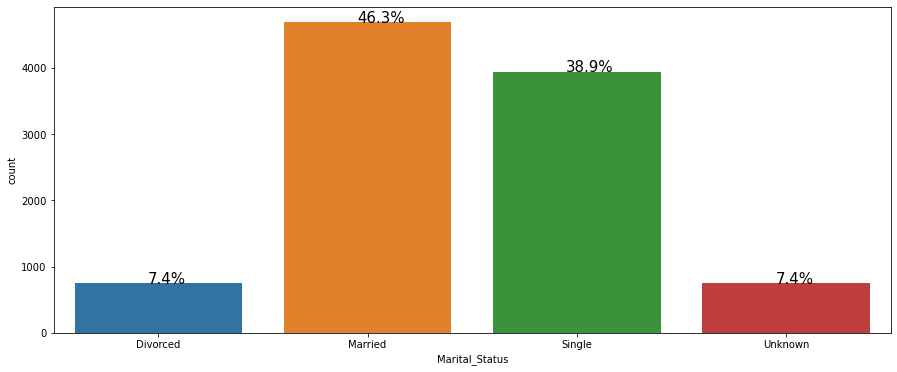

<Figure size 432x288 with 0 Axes>

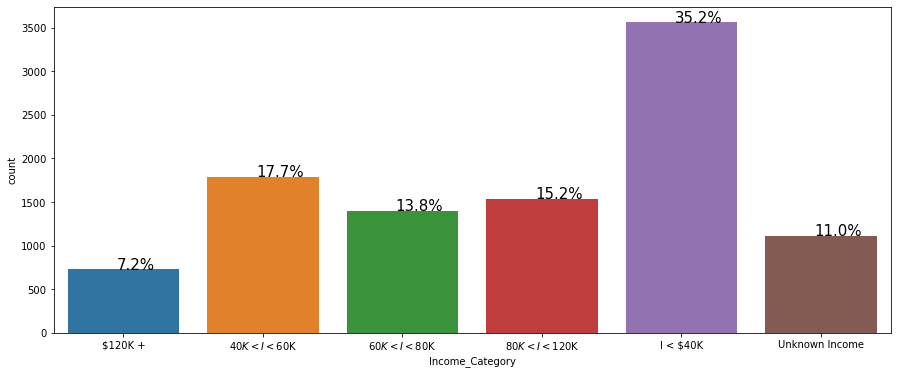

<Figure size 432x288 with 0 Axes>

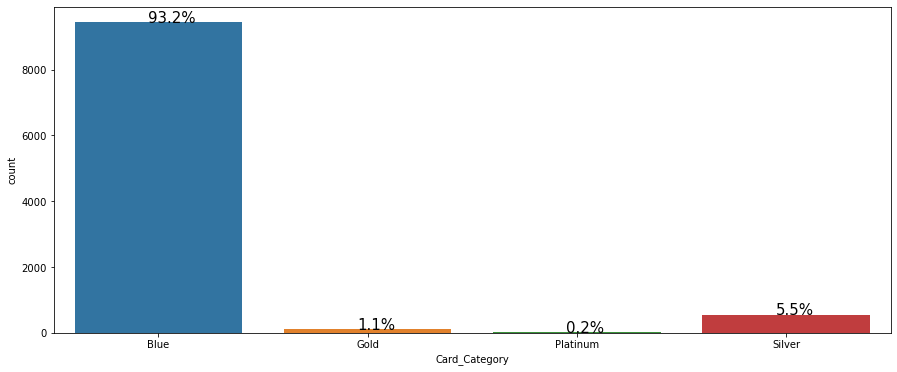

<Figure size 432x288 with 0 Axes>

In [453]:
for i in df.columns[df.dtypes == 'category']: # For loop to plot all of our categorical features along with their respective percentages
    plt.figure(figsize=(15,6))
    ax = sns.countplot(df[i])
    percentage_plot(ax, df[i])
    plt.figure()

In [97]:
df.describe(include=['category']).T

,count,unique,top,freq
Attrition_Flag,10127,2,Existing Customer,8500
Gender,10127,2,F,5358
Education_Level,10127,7,Graduate,3128
Marital_Status,10127,4,Married,4687
Income_Category,10127,6,I < $40K,3561
Card_Category,10127,4,Blue,9436


- As expected, we can see from our first countplot, that we are indeed dealing with an imbalanced dataset where 16 per cent of customers attrited and the remaining 84 per cent did not.
- We do see more females than males in customer composition, however it's not a very large difference. 53 per cent females and 47 per cent males.
- We also notice most customers are graduate individuals, composing 30 per cent of all categories. Followed by high-school educated at 20 per cent. These two classes make up half of all our customer base. We then have 14.7 per cent of uneducated customers. As expected, the lowest percentage pertains to Doctorate degress, with only 4.5 per cent of them.
- Almost 47 per cent of customers are single followed by 40 per cent married, and the remaining 13 per cent split almost perfectly between unknown and divorced.
- As expected, most customers have an income of less than 40k, with 35 per cent representation. 18 per cent make between 40k and 60k while 14 per cent make between 60k and 80k. It is also logical that the smallest percentage makes above 120k a year, with only 7.2 per cent. We do have 11 per cent of unknown income, which is a large percentage.
- Finally, most customers own a Blue card, 93 per cent of them use it. This is good news for the bank because the Blue Card is also the one that charges the most interest. We then have 5.5 per cent on silver, 1.1 on Gold and a tiny percentage, 0.2 own a Platinum card.
- While it is true we do not have any missing values, it is important to acknowledge the 'unknown' class in both Income Category as well as Education Level. There are two approaches to dealing with this. The first one would be to impute unknown with the mode of the GroupBy with highest correlation to the missing column, or use a KNN imputer to get this information. However, by doing that we are assuming these errors are random and can, in fact, be imputed without changing the distribution of our data. However, I am more interested in the second method, which is treating 'unknown' classes as their own as if they were any other category level. There is an assumption made here too, which is that there is a reason behind having unknown as an answer in those places. However, this assumption is much weaker than stating 11 and 12 per cent of the data just randomly happen to be missing. When encoding 'unknown' categories, it is common to to use 0 (when doing ordinal/label encoding), and we shall do this when doing feature engineering.

# Categorical Variables Relationships

In [98]:
# We want to see the relationship between our target variable and all of our categorical varibales. Let us see what we discover.
for i in df.columns[df.dtypes == 'category']:
    print(df.groupby(i)['Attrition_Flag'].value_counts(normalize=True))

Attrition_Flag     Attrition_Flag   
Attrited Customer  Attrited Customer    1.0
Existing Customer  Existing Customer    1.0
Name: Attrition_Flag, dtype: float64
Gender  Attrition_Flag   
F       Existing Customer    0.826428
        Attrited Customer    0.173572
M       Existing Customer    0.853848
        Attrited Customer    0.146152
Name: Attrition_Flag, dtype: float64
Education_Level  Attrition_Flag   
College          Existing Customer    0.847976
                 Attrited Customer    0.152024
Doctorate        Existing Customer    0.789357
                 Attrited Customer    0.210643
Graduate         Existing Customer    0.844309
                 Attrited Customer    0.155691
High School      Existing Customer    0.847988
                 Attrited Customer    0.152012
Post-Graduate    Existing Customer    0.821705
                 Attrited Customer    0.178295
Uneducated       Existing Customer    0.840619
                 Attrited Customer    0.159381
Unknown          Existin

- We could obtain all the information we require from this GroupBy but it is a little messy, we can instead use visualizations to better undertsand the results.
- Since we don't have too many categorical features, we can go ahead and plot them with hue = Attrition_Flag and that should help us find some insight easier!

In [99]:
# Since it would be much more complex to use seaborn for a plot with hue, we will use a package we learned about at the beginning of the course, plotly. This
# function will create a dataframe with the percentage values much like the GroupBy we did above, and will then plot these values on inside of our bars.
import plotly.express as px

def percentage_plot_hue(df, col, target):

    # We use the groupby like we did above to create a df with the respective percentages
    perc_df = df.groupby(col)['Attrition_Flag'].value_counts(normalize=True)
    perc_df = perc_df.mul(100).rename('Percent').reset_index()
    perc_df['Percent'] = perc_df['Percent'].round(decimals=1) # As we notice from above, our percnetages have several significant digits, so we rounf to a single one

    # Plotly allows us to parse text, which saves us the hassle of manipulating the options directly like with matplotlib
    fig = px.bar(perc_df, x=col, y='Percent', color=target, 
                    barmode="group", text='Percent', title=f"Percent {target} By {col}")

    return fig

In [100]:
percentage_plot_hue(df, 'Gender', 'Attrition_Flag')

- As expected, this countplot with hue is much easier to read. We can see a slight difference in attrition with respect to gender. Females have a slightly higher probability of service attrition, with 17.4 percent of them having left the service.
- On the other hand, we can see only 14.6 per cent of them have renounced the credit card service and 85.4 still make use of it.

In [101]:
percentage_plot_hue(df, 'Education_Level', 'Attrition_Flag')

- First thing to notice is that those most highly educated, in other words, those with a Doctorate, have the highest percentage of attrition compared to other levels of education. This might be because they have a higher salary and thus, no need for a Credit Card, or because they know interests in CC are very high and difficult to handle. Post Graduate customers have the next highest attrition rate, so this theory might have some substance behind it.
- We notice the same distribution for College and High School graduates, with an attrition rate of 15.2 per cent. Graduates have a slightly higher rate of 15.6 per cent, followed by uneducated of 15.9, similar values in all these 3 groups.
- We notice that our unknown education category has an attrition rate of 16.9 per cent, which is actually the mean value for all 7 groups. This leads me to belaive that this group is composed of a combination of all other 6 groups.

In [102]:
# Let us quickly see if my theory of higher education level and higher wage bracket is actually correct or not
df.groupby('Education_Level')['Income_Category'].value_counts(normalize=True)

Education_Level  Income_Category 
College          I < $40K            0.340573
                 $40K < I < $60K     0.180652
                 $80K < I < $120K    0.172754
                 $60K < I < $80K     0.130306
                 Unknown Income      0.106614
                 $120K +             0.069102
Doctorate        I < $40K            0.350333
                 $40K < I < $60K     0.155211
                 Unknown Income      0.155211
                 $60K < I < $80K     0.130820
                 $80K < I < $120K    0.126386
                 $120K +             0.082040
Graduate         I < $40K            0.364130
                 $40K < I < $60K     0.176790
                 $80K < I < $120K    0.152813
                 $60K < I < $80K     0.134910
                 Unknown Income      0.106138
                 $120K +             0.065217
High School      I < $40K            0.333333
                 $40K < I < $60K     0.176354
                 $80K < I < $120K    0.153005


- We can indeed see that Doctorate holders have the largest percentage of individuals earning more than 120 000 dollars per year. With a total of 8.2 per cent. However, and interestingly, uneducated follow close behind, with 8 per cent of total. This could be because amongst those uneducated, there are entrepreneurs who have created succesful businesses.
- The largest percentage of individuals who earn less than 40K are both the unknown category and the Graduate category, at around 36.5 per cent in both cases. While the least percentage can be found in the Post-Graduate category, at 33 per cent.
- Finally, only the Doctorate group has individuals who earn between 80k to 120k. This might become and important varibale in our models.

In [103]:
# Let us continue with our variable relationship analysis
percentage_plot_hue(df, 'Marital_Status', 'Attrition_Flag')

- From our plot above, we can see the Unknown category is the one with highest attrition rate at 17.2 per cent.
- Married couple have the lowest attrition rate, could this be because of extra costs that are brought upon by raising a child? This could very well be the case since we notice single has the highest attrition rate after Unknown (which we are assuming is a combination of other categories), where 16.9 per cent of individuals attritted.

In [104]:
percentage_plot_hue(df, 'Income_Category', 'Attrition_Flag')

- As expected, the group with the highest attrition rate is 120k + income per year, with 17.3 per cent of the total having dropped the service. Of course, as your income increases, the need to use a credit card to buy goods and services diminishes. However, we notice the next group with highest attrition rate is actually income less than 40k, which our lowest wage bracket, which tests our theory above.
- The group with the largest amount of existing customer is income category 60 to 80, with 86.5 per cent of them using the credit card service.

In [105]:
percentage_plot_hue(df, 'Card_Category', 'Attrition_Flag')

- We can see that exactly 1 fourth of all Platinum Card holder have attrited the service. This could be due to several factors. First of all it is the group with the least amount of customers, so any change individuals composition will have a large effect on the final ratio. Second of all, the higher the card tier, the more expensive the year fee usually is, which might make customers drop the service.
- On the other hand, the Silver Card category has the lowest attrition rate at 14.8 per cent, followed by the basic package, which is Blue, at 16.1 per cent. Gold Card holders are in the middle, with an attrition rate of 18.1 per cent. The thing to note here is the fact that Platinum certainly has a larger deviation than the other 3 tiers, which means it will probably be a good variable for our models to use.

# Continous Variables

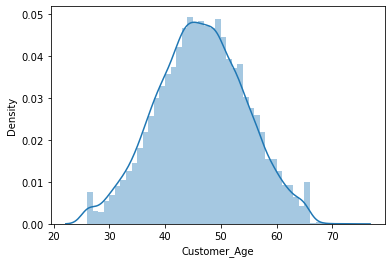

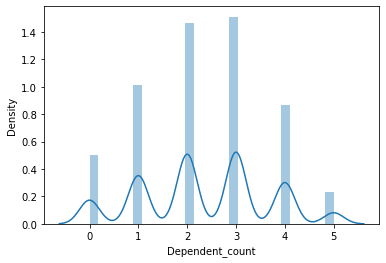

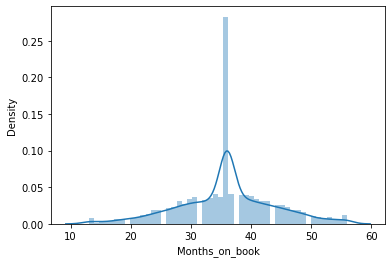

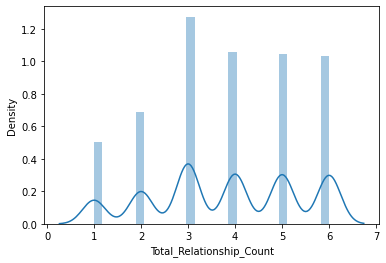

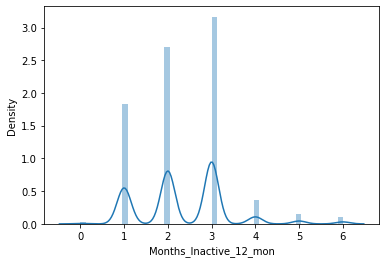

...

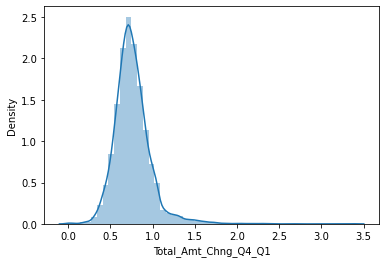

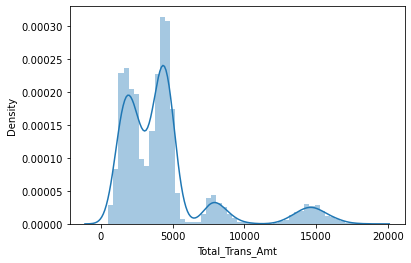

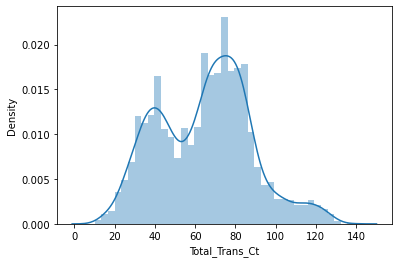

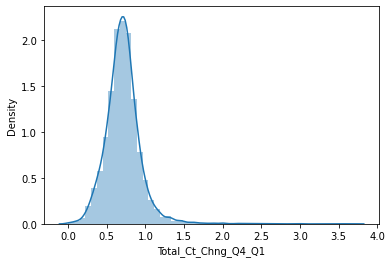

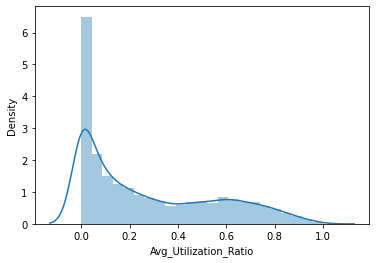

<Figure size 432x288 with 0 Axes>

In [538]:
for i in df.select_dtypes([np.number]).columns:
    sns.distplot(df[i]);
    plt.figure()

- As we have come to expect from variables that are related to wage and expense, we see that Avg_Utilization_Ratio, Total_Ct_Chng_Q4_Q1, Total_Trans_Amt, Total_Amt_Chng_Q4_Q1, Avg_Open_to_Buy and Credit_Limit are highly positively skewed. This comes at no surprise as we noticed the quartile values at the beginning of this exercise. We will have to implement a log transformation to try and make the distribution resemble a Gaussian Normal Distribution.
- We notice that a considerable amount of individuals have been with the bank for around 3 years, and that most people have 3 service contracts witht the bank.
- As we expect, Age is relatively normally distributed, and the average age is 46 years old.
- Interestingly, a considerable number of customers have a revolving Credit balance of 0, which tells us that they fully pay for the credit they use during that month.
- Although, once we combine that with Avg_Utilization_Ratio, it seems a high number of people do not use their credit card at all, exemplified by the large bin centered at 0. In additon to this, the mode in Avg_Open_To_Buy is close to the mode of Credit_Limit, which substantiates the theory that many cardholders do not use their available credit.

In [539]:
df.groupby('Attrition_Flag').mean().T

Attrition_Flag,Attrited Customer,Existing Customer
Customer_Age,46.659496,46.262118
Dependent_count,2.402581,2.335412
Months_on_book,36.178242,35.880588
Total_Relationship_Count,3.279656,3.914588
Months_Inactive_12_mon,2.693301,2.273765
Contacts_Count_12_mon,2.972342,2.356353
Credit_Limit,8136.039459,8726.877518
Total_Revolving_Bal,672.822987,1256.604118
Avg_Open_To_Buy,7463.216472,7470.273400
Total_Amt_Chng_Q4_Q1,0.694277,0.772510


# Continous Variables Relationships

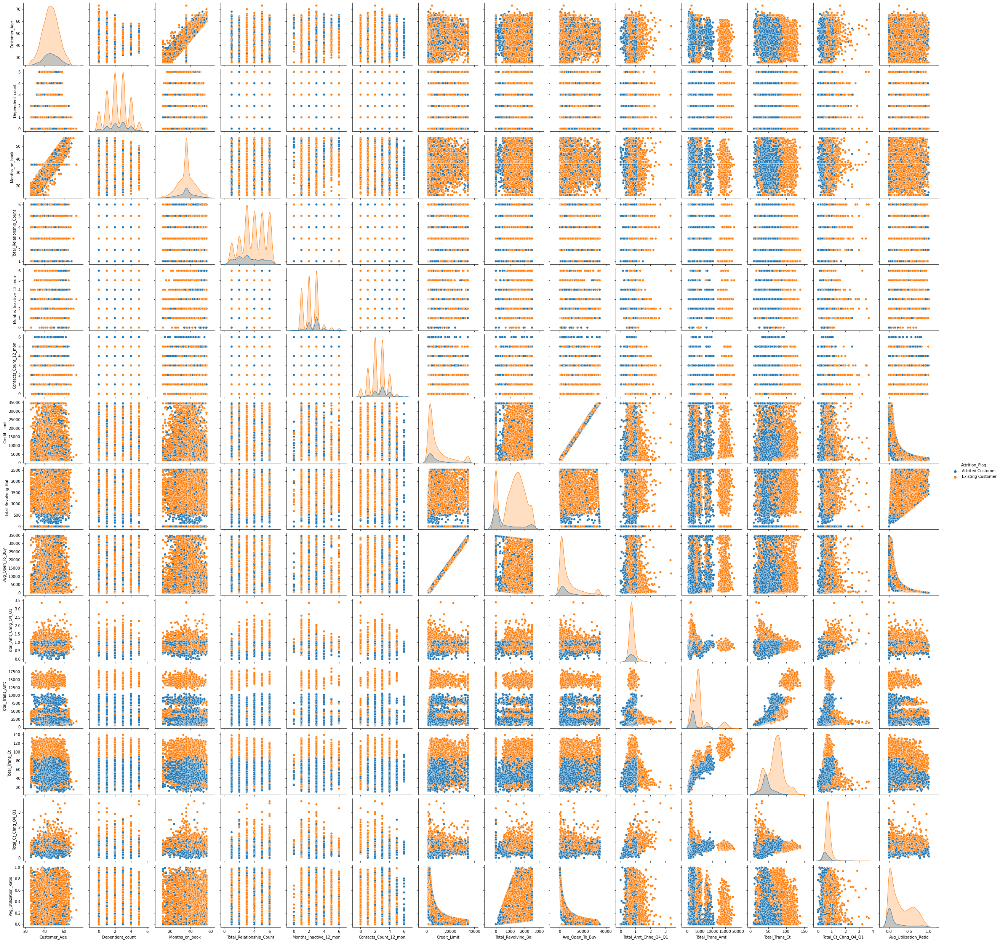

In [540]:
sns.pairplot(df, x_vars=['Customer_Age', 'Dependent_count', 'Months_on_book', 
                         'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
                        'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
             y_vars=['Customer_Age', 'Dependent_count', 'Months_on_book', 
                         'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
                        'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
             hue='Attrition_Flag')

- Most of the mean values above are the same when grouped by Attrition_Flag, so let us focus on the values which are different.
- Avg_Utilization_Ratio is much lower for customer who attrited, at almost half the value of those who are existing customers. This makes logical sense, if you are not using your card, might as well cancel it to avoid paying annual fees.
- Total_Ct_Chng_Q4_Q1 is also 50 per cent lower for Attrited_Customers, whoch follows the same logic as above.
- In order to close your Credit Account, you must have close to revolving balance, so it makes sense that Attrited Customers have a lower balance of 673 vs existing customers with 1257, almost double.
- These variables have a relatively high difference between them, they will most likely prove useful to our models.
- The pairplot also reveals an almost 1 to 1 correlation between Customer Age and months on book, which makes logical sense as every year you pass on the book, your age also increases by one. We see the same with Credit_Limit and Avg_Open_To_Buy, as we noticed in the histograms earlier.
- We can also see that there is a somewhat weak relationship between Total_Revolving_Bal and Avg_Utilization_Ratio, which again, makes logical sense since the more you use your card, the higher the amount you'll have to pay later on.

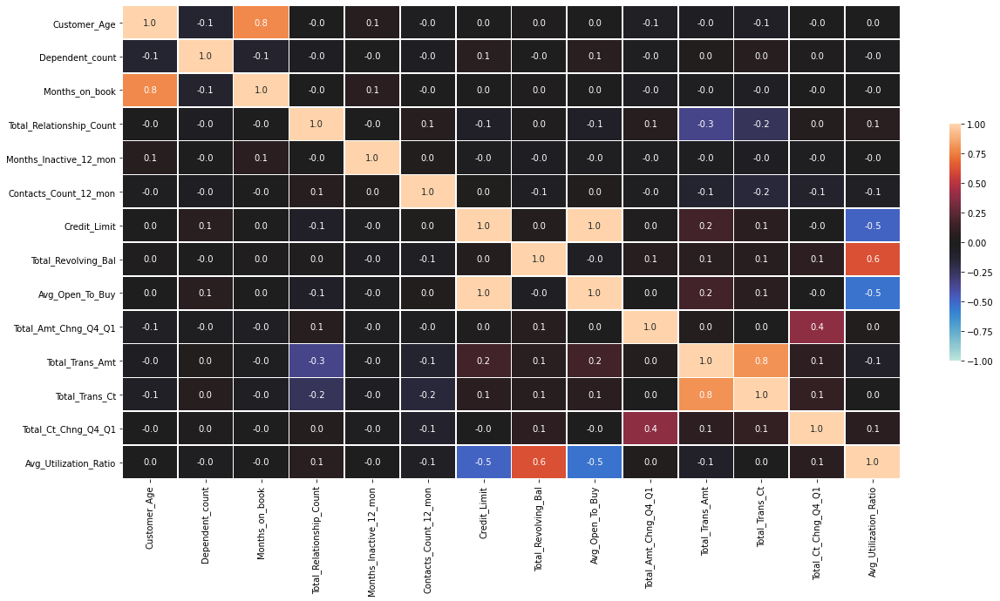

In [541]:
# Let us better visualize the relationship between variables with a heatmap
numeric_columns = df.select_dtypes(include=np.number).columns.tolist()
corr = df[numeric_columns].corr()

f, ax = plt.subplots(figsize=(20, 10)) #Set heatmap size

sns.heatmap(corr, annot=True,fmt=".1f",vmin=-1, vmax=1, center= 0, square=False, linewidths=.7, cbar_kws={"shrink": .5});

- As expected, there is a correlation of .8 between Age and Months_on_Book.
- There is a one to one correlation between Credit_Limit and Avg_Open_to_Buy.
- Only mild correlation between Total_Revolving_Bal and Avg_Utilization_Ratio of .6
- Since the first model we will use is Logistic Regression, we will probably have to drop a few columns

AxesSubplot(0.125,0.125;0.775x0.755)


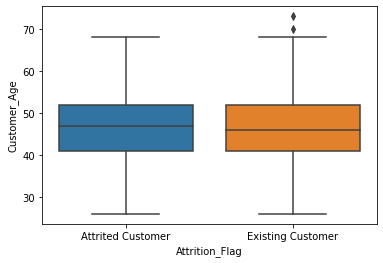

In [542]:
# We have explored the mean values per attrition group, but a boxplot can provided more information on the distribution of the data
print(sns.boxplot(x='Attrition_Flag', y='Customer_Age', data=df))

- Not only are the means almost identical, the distribution itself is almost the same as well, except for a couple outliers in the Existing Customer Cohort

AxesSubplot(0.125,0.125;0.775x0.755)


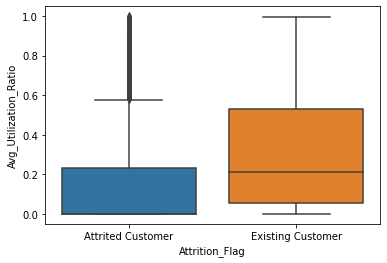

In [543]:
print(sns.boxplot(x='Attrition_Flag', y='Avg_Utilization_Ratio', data=df))

Much more interesting distribution differences here. Existing Customer shows no outliers but we see many in the Attrited Customer cohort, this is because the majority of them have a very low Avg_Utilization_Ratio

AxesSubplot(0.125,0.125;0.775x0.755)


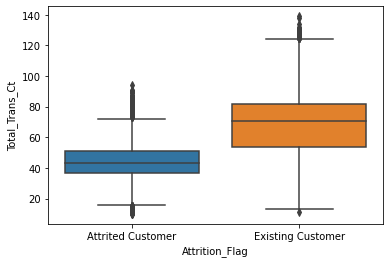

In [544]:
print(sns.boxplot(x='Attrition_Flag', y='Total_Trans_Ct', data=df))

- It is to be expected that Attrited Customers would show a lower count of transactions than Existing Customers, we do see both cohorts contain a few examples outside the box whiskers

AxesSubplot(0.125,0.125;0.775x0.755)


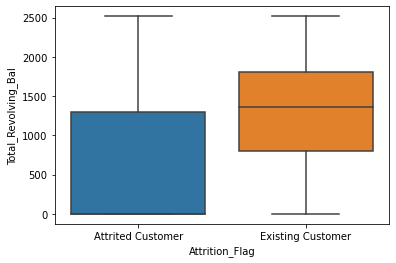

In [545]:
print(sns.boxplot(x='Attrition_Flag', y='Total_Revolving_Bal', data=df))

- Another of the variables we noted have large discrepancies between the groups, Total_Revolving_Credit shows not outliers in either cohort, but the large majority of Attrited Customers have a very low Revolving Credit.

AxesSubplot(0.125,0.125;0.775x0.755)


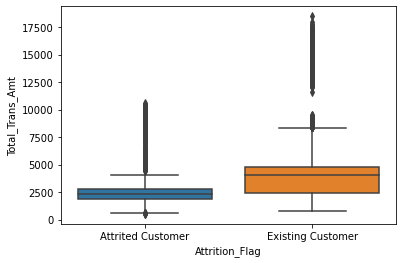

In [546]:
print(sns.boxplot(x='Attrition_Flag', y='Total_Trans_Amt', data=df))

- Similarly to Avg_Utilization_Ratio, we see quite a few outliers in both cohorts when looking at Total_Transaction_Amount, perhaps this will change once we do a log trnaformation and look for outliers.
- Let us try and see Total_Trans_Amount with respect to Card type, perhaps there will be a difference there we notice.

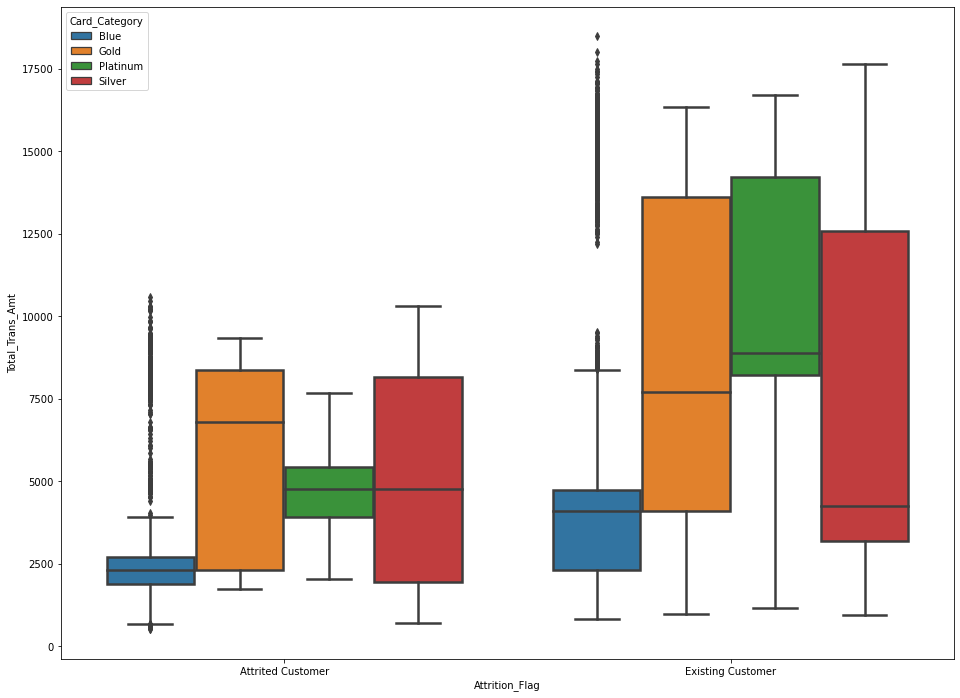

In [547]:
plt.figure(figsize=(16, 12))
sns.boxplot(df['Attrition_Flag'],df['Total_Trans_Amt'],hue=df['Card_Category'], linewidth=2.5)
plt.show()

- The above boxplot sheds some useful light on the distribution of our data per cohort. Indeed, we can now notice all outliers in both cases lie within the Blue Card category.
- The mean for Silver Card is actually higher for Attrited Customers than for Existing Customers, something we couldn't notice before looking at this visualization.

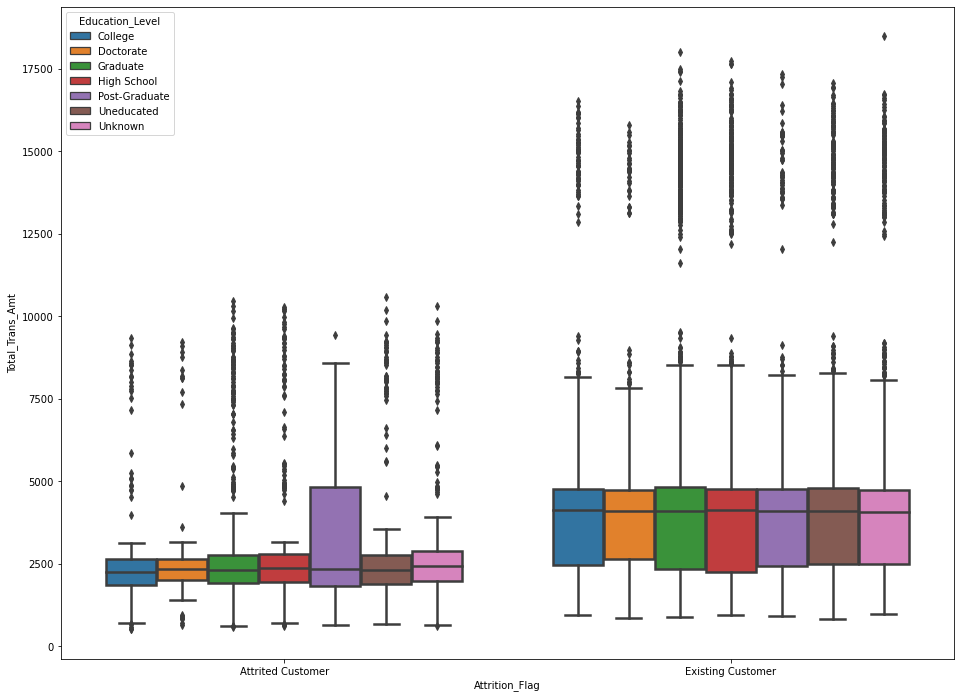

In [106]:
plt.figure(figsize=(16, 12))
sns.boxplot(df['Attrition_Flag'],df['Total_Trans_Amt'],hue=df['Education_Level'], linewidth=2.5)
plt.show()

- There does not seem to be much variance within Education_Level when we separate by outcome. This means Education Variable will probably not be very useful for our models.
- However, there is a clear differnece in means as we had already noted above, I theorize Total_Transaction_Amount will be an importance source of information for the models.
- Notice outliers themselves seem to be similarly distributed!
- From our analysis above, the histograms with hue and the bosplot show us a relatively high difference between values of customers who attrited and current customers. There is clearly a much higher difference that the percentages we observed when doing categorical analysis. This tells us our models will probably place a higher degree of importance on these continous variables than on the categorical ones. We shall see how it goess as we implement our algorithms and then look at feature importance plots, or odds and log odds for our log regression model.

# Outlier Detection and Treatment (if required)

In [454]:
# We noticed a few of our columns were rather skewed, so let us apply a log transformation and then look at the resulting boxplots. In reality, we do this
# for a our Linear Regression model rather than our tree based model whoch can handle non-normal distributions
from scipy import stats
for i in ['Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']:
    df[i]=np.log(df[i] + 1) # We add 1 because many of our values are zero and we can't take the log of zero

In [108]:
# We will now make use of the functions from previous lessons and projects to better understand the distribution of each numerical value. 
# This will provide more detailed insight than the above histograms because it also plots a boxplot and shows the mean and median of data. 
# Notice we have applied the log tranformation on our highly skewed variables, so this way we will also see if that worked properly.

def histogram_boxplot(feature, figsize=(10,8), bins = None):
    f2, (ax_box2, ax_hist2) = plt.subplots(nrows = 2, # Number of rows of the subplot grid= 2
                                           sharex = True, # x-axis will be shared among all subplots
                                           gridspec_kw = {"height_ratios": (.15, .85)}, 
                                           figsize = figsize 
                                           ) # These are the options for how the 2 plots will look in a single image
    sns.boxplot(feature, ax=ax_box2, showmeans=True, color='white') # boxplot will be created and a star will indicate the mean value of the column
    sns.distplot(feature, kde=False, ax=ax_hist2) # For histogram
    ax_hist2.axvline(np.mean(feature), color='green', linestyle='-') # Add mean to the histogram
    ax_hist2.axvline(np.median(feature), color='blue', linestyle='dashdot') # Add median to the histogram

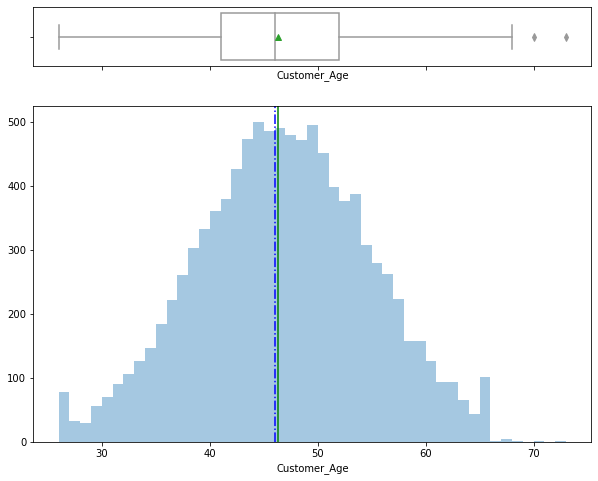

In [550]:
histogram_boxplot(df['Customer_Age'])

In [551]:
df.loc[np.argmax(df['Customer_Age'])]

Attrition_Flag              Existing Customer
Customer_Age                               73
Gender                                      M
Dependent_count                             0
Education_Level                   High School
Marital_Status                        Married
Income_Category               $40K < I < $60K
Card_Category                            Blue
Months_on_book                             36
Total_Relationship_Count                    5
Months_Inactive_12_mon                      3
Contacts_Count_12_mon                       2
Credit_Limit                          8.40514
Total_Revolving_Bal                   7.02643
Avg_Open_To_Buy                       8.11522
Total_Amt_Chng_Q4_Q1                 0.859932
Total_Trans_Amt                       7.47647
Total_Trans_Ct                             34
Total_Ct_Chng_Q4_Q1                  0.961264
Avg_Utilization_Ratio                0.224742
Name: 251, dtype: object

- We first notice a few examples on the on the higher range in customer age, however it is a reasonable age, around 73 years old and it is perfectly possible to have clients at this age point so we won't remove them.
- Notice mean and median are actually very close together, and this distribution closely resembles a normal one.

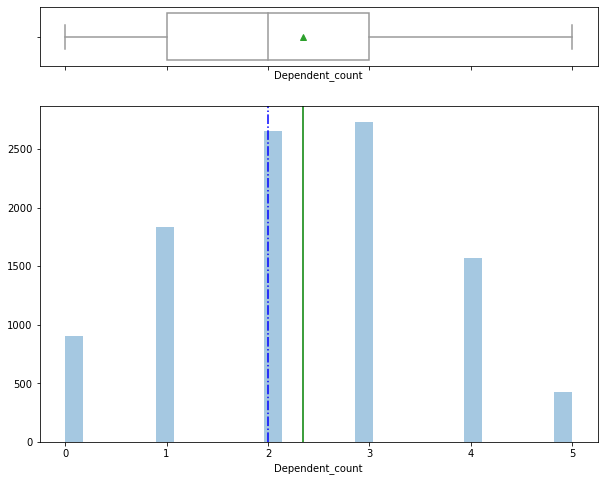

In [552]:
histogram_boxplot(df['Dependent_count'])

- We notice no outliers in the histogram for Dependent_count
- The mean is about 2.3 while the median is somewhat lower at 2 dependents

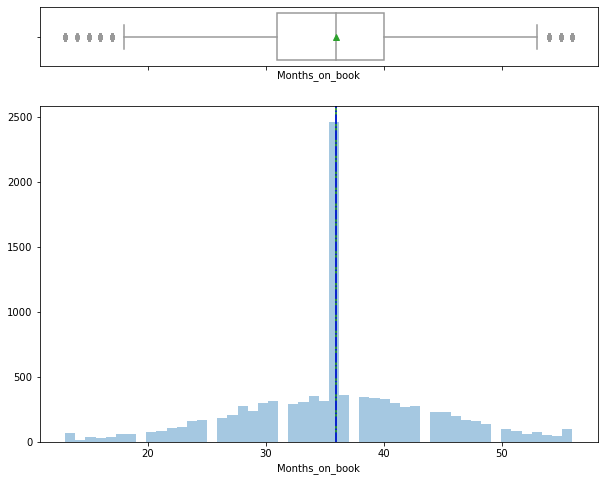

In [553]:
histogram_boxplot(df['Months_on_book'])

In [554]:
df.loc[np.argmax(df['Months_on_book'])]

Attrition_Flag              Existing Customer
Customer_Age                               61
Gender                                      M
Dependent_count                             1
Education_Level                   High School
Marital_Status                        Married
Income_Category               $40K < I < $60K
Card_Category                            Blue
Months_on_book                             56
Total_Relationship_Count                    2
Months_Inactive_12_mon                      2
Contacts_Count_12_mon                       3
Credit_Limit                          8.06903
Total_Revolving_Bal                   7.83122
Avg_Open_To_Buy                       6.51767
Total_Amt_Chng_Q4_Q1                  1.04063
Total_Trans_Amt                       7.19818
Total_Trans_Ct                             30
Total_Ct_Chng_Q4_Q1                  0.762207
Avg_Utilization_Ratio                0.581098
Name: 18, dtype: object

- This is an interesting distribution, both mean and median are equal according to the pot, but certanly this is not a normal distribution since it has Platykurtic shape, in other words, it is rather flat.
- The higher values are almost 56 months old, or about 5 years, which is a reasonable amount considering the age of the customers at that point. Alternatively, the customers in the lower range of Months_on_Book are also the youger ones, so no problems there either.

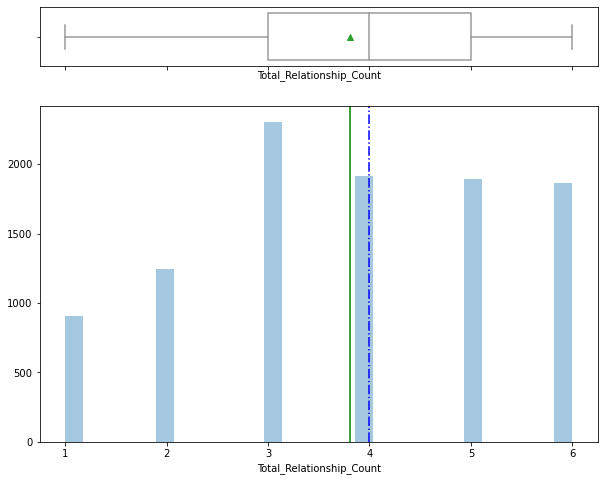

In [555]:
histogram_boxplot(df['Total_Relationship_Count'])

- We notice no outliers for Total_Relationship_Count but we dont see a fully normal distribution either.
- The mean is lower than the median 3.8 vs 4 respectively.

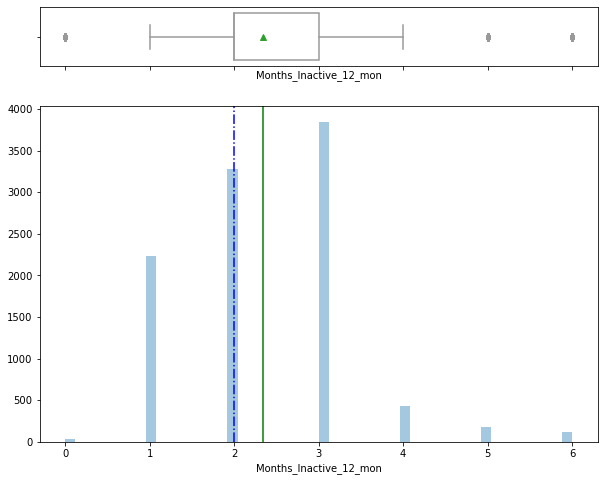

In [556]:
histogram_boxplot(df['Months_Inactive_12_mon'])

- We can see a couple ouliers in both sides of the distibution. However, we can note they are within a range of 6 months which is completely plausible, for this reason we will not delete these entries.
- Most customer have been inactive under 3 months. we see the mean at 2.3 and median at 2 months. According to the chart, it's somewhat unlikely that customers don't use their cards for 5 or 6 months.

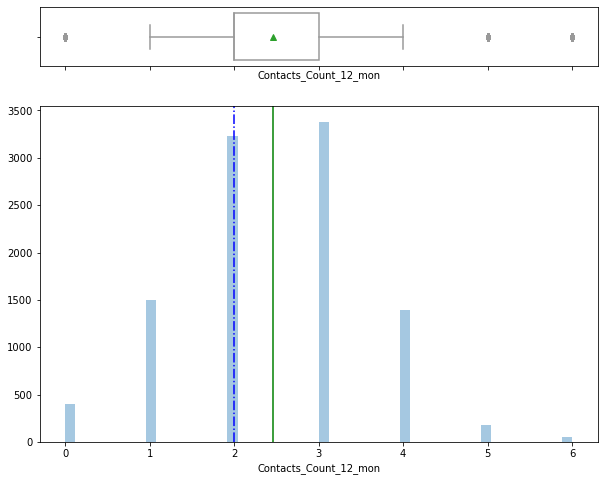

In [557]:
histogram_boxplot(df['Contacts_Count_12_mon'])

- We can apply a similat logic as we did above. While we do have some outliers present in either side of the distibution, both are contained within a 6 month range and for this reason, consider the values plausible and will not be deleted.
- As above, the mean is higher than the median, with values of 2.4 and 2 respectively.

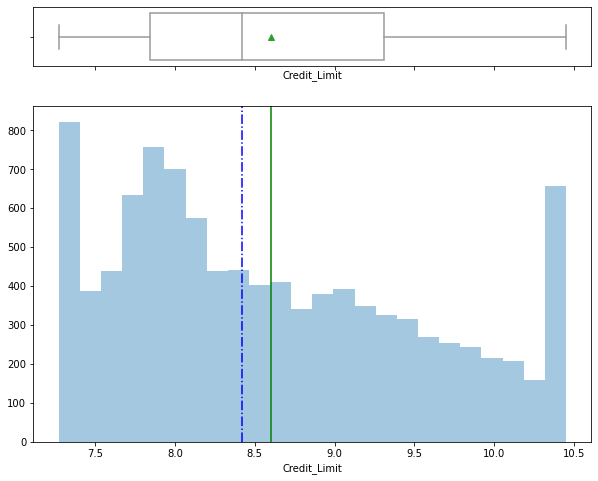

In [558]:
histogram_boxplot(df['Credit_Limit'])

- After performing our log transformation, we notice we no longer have outliers in our distribution. However, we still have an irregular shape that is certainly not normal.
- The mean is centered around 8.6 while the median is lower at 8.4

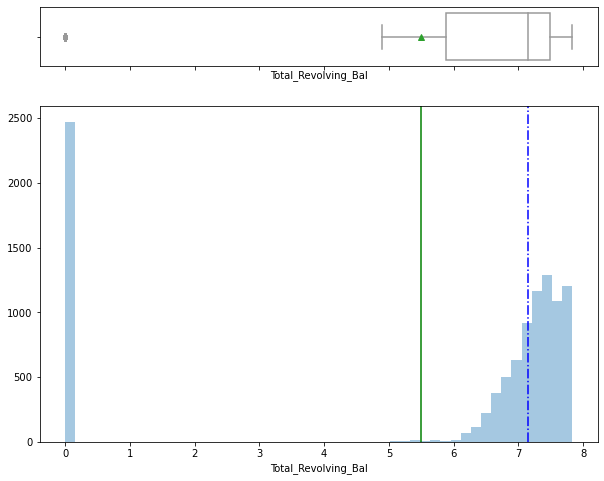

In [559]:
histogram_boxplot(df['Total_Revolving_Bal'])

- Total Revolving Balance shows an interesting pattern, we have an outlier at point 0. However, if we remember, a considerable number of clients had 0 Balance on their cards from previous months, this just means they pay the pending credit in its totality before due date. Again, we won't manipulate these outliers.
- For the reasons above, the mean is quite lower than the median, with mean 5.5 and median 7.1

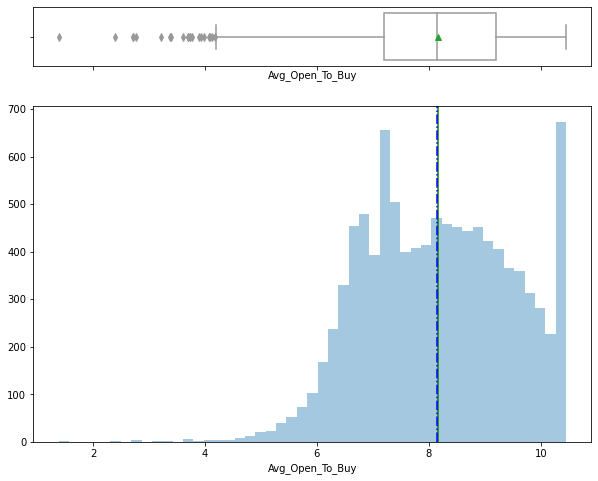

In [560]:
histogram_boxplot(df['Avg_Open_To_Buy'])

In [561]:
df.loc[np.argmin(df['Avg_Open_To_Buy'])]

Attrition_Flag              Attrited Customer
Customer_Age                               38
Gender                                      F
Dependent_count                             3
Education_Level                    Uneducated
Marital_Status                         Single
Income_Category               $40K < I < $60K
Card_Category                            Blue
Months_on_book                             30
Total_Relationship_Count                    3
Months_Inactive_12_mon                      2
Contacts_Count_12_mon                       3
Credit_Limit                          7.79811
Total_Revolving_Bal                   7.79688
Avg_Open_To_Buy                       1.38629
Total_Amt_Chng_Q4_Q1                 0.113329
Total_Trans_Amt                       7.28688
Total_Trans_Ct                             32
Total_Ct_Chng_Q4_Q1                 0.0980337
Avg_Utilization_Ratio                0.692647
Name: 4443, dtype: object

- Checking on the farthest example in Avg_Open_To_Buy to the right, we see the customer has a very low available credit but its Credit_Limit and Total_Revolving_Bal check out as well, so no problems there.
- Mean and median are the same at 8.1, but we notice a negative skew

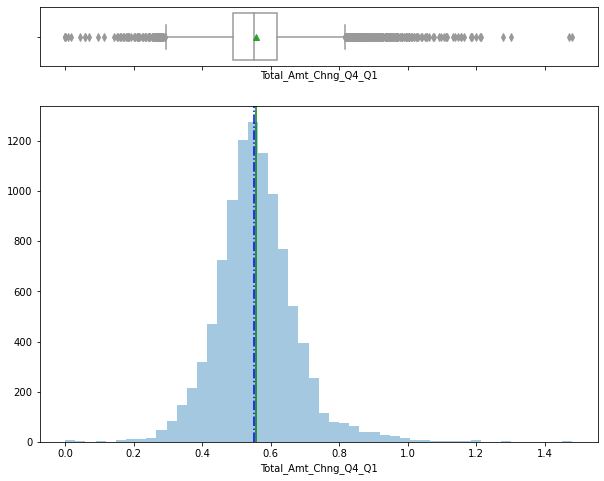

In [562]:
histogram_boxplot(df['Total_Amt_Chng_Q4_Q1'])

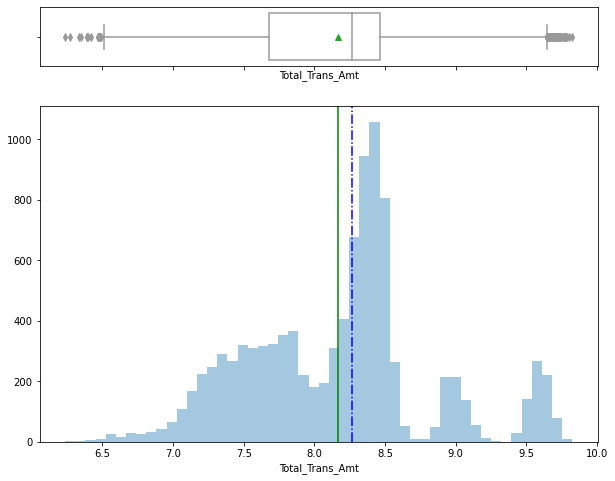

In [563]:
histogram_boxplot(df['Total_Trans_Amt'])

- Total_Amt_Change and Total_Ct_Change show several outliers, but there is a logical reason for this. If we take a look at our histograms, we notice the mode for Total_Revolving_Balance is 0. Couple that with the fact that the distribution peak for Total_Ct_Change is near 0, then examples who tended to use more their card at the end of the year will fall outside the boxplot. However, we can't get rid of them since they carry information about customer behavior.
- Total_Amt_Chng_Q4_Q1 does show a resemblance to a normal distribution but it has a high kurtosis which makes it pointy, though both mean and median are centered at around .5

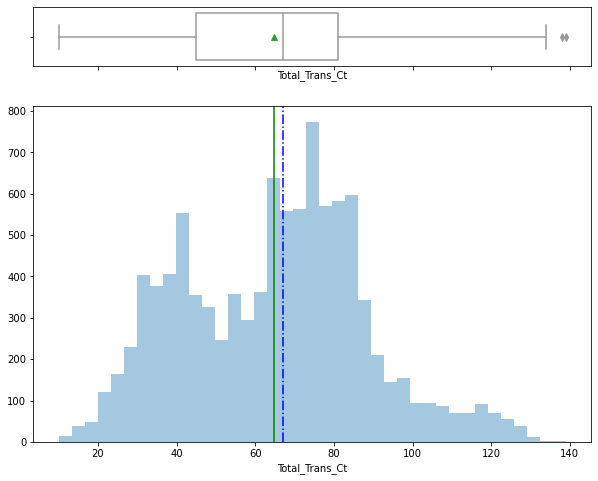

In [564]:
histogram_boxplot(df['Total_Trans_Ct'])

- We notice no outliers in Total_Trans_Ct after our transformation. We also notice a bimodal distribution at 40 and 75. As such, mean and median are found between these two peaks at 65 and 67 respectively.

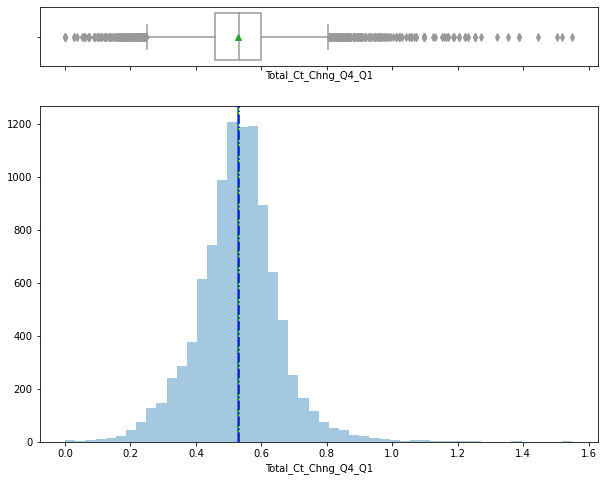

In [565]:
histogram_boxplot(df['Total_Ct_Chng_Q4_Q1'])

- While the mean are median for Total_Ct_Chng_Q4_Q1 are both centered at .55 after our log transformation, we still have outliers at both ends of our distribution. Since most individuals have a Revolving Credit of 0, we could assume the change in quarters to be relatively low, which makes people who use their card at the end of the year for holiday shopping seem as outliers, however the information does not seem to be corrupted and for this reason, we will not delete any entries.

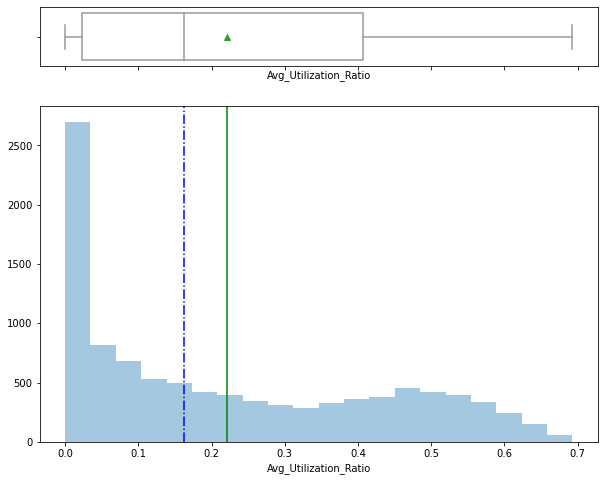

In [566]:
histogram_boxplot(df['Avg_Utilization_Ratio'])

- Even after our log transformation, the distribution looks very similar to what we had before. The mean is a ratio of .21 while the median is lower at 1.8.

- Finally, the main reason we will not delete any of the examples found above is the fact that non-linear models are able to handle outliers with ease. And while it is true we will first implement a Logistic Regression algorithm, none of the outliers above seem extreme enough to cause a large deviation in our model.

# Feature Engineering and Data Preparation

In [455]:
# We will add a column which represents the average total revolving balance in the past year for each customer
df['Average_Revolving_Credit'] = df['Total_Revolving_Bal']/12

In [456]:
# Another useful feature might be the average amount per transaction made. Let us add this feature as well
df['Average_Amount_Per_Transaction'] = df.Total_Trans_Amt / df.Total_Trans_Ct

In [457]:
# Some of our variables are of categorical type, which means we can't feed them into our models directly. However, it's important to distinguish between
# ordinal and nominal cateogories. Ordinal categories = Education_Level, Income_Category, Card_Category. Nominal = Gender, Marital_Status
# Education Level and Income Category are regularly enocoded with label encoder as ordinal values, however, Card Category is not as straight forward, but here we
# make the decison of encoding as ordinal since we assume a hierarchy within card level, and that the 'blue' tier is the lowest, while the 'platinum' tier is the 
# highest

df['Education_Level'].replace(to_replace=['Unknown', 'Uneducated', 'High School', 'College', 'Graduate', 'Post-Graduate', 'Doctorate'],
                              value=[0, 1, 2, 3, 4, 5, 6], inplace =True)
df['Income_Category'].replace(to_replace=['Unknown Income', 'I < $40K', '$40K < I < $60K', '$60K < I < $80K', '$80K < I < $120K', '$120K +'],
                              value=[0, 1, 2, 3, 4, 5], inplace =True)
df['Card_Category'].replace(to_replace=['Blue', 'Silver', 'Gold', 'Platinum'],
                              value=[1, 2, 3, 4], inplace =True)
df['Attrition_Flag'].replace(to_replace=['Attrited Customer', 'Existing Customer'],
                            value=[1,0], inplace=True)
# Notice we purposely gave 'Unknown' category 0, as is commonly done when we don't know the values and its hierarchy
df_dummies = pd.get_dummies(df, prefix=['Gender', 'Marital_Status'],
                            columns=['Gender', 'Marital_Status'], 
                            drop_first=True)

In [112]:
# We create a custom function to measure the performance of our models. Since we will also be applying several different models, this way we don't have to write a function every single time we
# require it

def metrics_func(model, X_train, X_test, y_train, y_test): # The function takes the model and then computes the performance 
    # measures on both train and test sets
    
    pred_train = model.predict(X_train) # makes predictions which we then pass to our performance measure functions
    pred_test = model.predict(X_test)
    
    # We use sci-kit pre made functions to print our results
    print("Accuracy on training set : ",accuracy_score(pred_train,y_train))
    print("Accuracy on test set : ",accuracy_score(pred_test,y_test))
    print("Recall on training set : ",recall_score(y_train,pred_train))
    print("Recall on test set : ",recall_score(y_test,pred_test))
    print("Precision on training set : ",precision_score(y_train,pred_train))
    print("Precision on test set : ",precision_score(y_test,pred_test))
    print("F1 score on training set : ",f1_score(y_train,pred_train))
    print("F1 score on test set : ",f1_score(y_test,pred_test))

# We also need a function that creates a confusion matrix so we can visualize the performance of our model and compare the
# vanilla version with the improved versions, as well as comparing algorithm perfomances (logistic regression - tree)
def conf_matrix(model, X, y, labels=[1, 0]):
    
    y_predict = model.predict(X)
    cm=metrics.confusion_matrix( y, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["Actual - No","Actual - Yes"]], # show labels
                  columns = [i for i in ['Predicted - No','Predicted - Yes']])
    group_counts = ["{0:0.0f}".format(value) for value in # format how many zeroes to show
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in # show underneath count the percentage value
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)] # zip function to make tuples of number of values and respective %
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (10,7))
    sns.heatmap(df_cm, annot=labels,fmt='')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# We need a function that will output a DataFrame comparing the models we provide to it
def comp_func(model):

    
    pred_train = model.predict(X_train) # makes predictions which we then pass to our performance measure functions
    pred_test = model.predict(X_test)
    
    score_list=[] 
    
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    
    train_acc = model.score(X_train,y_train)
    test_acc = model.score(X_test,y_test)
    
    train_recall = metrics.recall_score(y_train,pred_train)
    test_recall = metrics.recall_score(y_test,pred_test)
    
    train_precision = metrics.precision_score(y_train,pred_train)
    test_precision = metrics.precision_score(y_test,pred_test)
    
    train_f1 = f1_score(y_train,pred_train)
    test_f1 = f1_score(y_test,pred_test)
    
    score_list.extend((train_acc,test_acc,train_recall,test_recall,train_precision,test_precision, train_f1, test_f1))
    
    return score_list

# Linear Regression, Upsampling, Downsampling and Regularization

In [458]:
# Preliminary separation of response varibale and our feature set
X = df_dummies.drop(columns='Attrition_Flag')
y = df_dummies[['Attrition_Flag']]

In [459]:
# Before standardizing our data, we will separate in training and testing set and fit the standardscaler on training set, but only fit it in testing set to avoid 
# data leakage
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(X, y, test_size=0.30, random_state=9, stratify=y)

In [460]:
# Instantiate Scaler
standard_reg = StandardScaler()

In [461]:
# Fit and transform numerical columns in training dataset
X_train_reg[['Customer_Age', 'Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
        'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio', 'Average_Revolving_Credit',
'Average_Amount_Per_Transaction']] = standard_reg.fit_transform(X_train_reg[['Customer_Age', 'Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
        'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
        'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio', 'Average_Revolving_Credit',
        'Average_Amount_Per_Transaction']])

In [462]:
# Now we just transform our data instead of fiting it first to avoid data leakeage
X_test_reg[['Customer_Age', 'Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
        'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio', 'Average_Revolving_Credit',
'Average_Amount_Per_Transaction']] = standard_reg.transform(X_test_reg[['Customer_Age', 'Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 
        'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
        'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio', 'Average_Revolving_Credit',
        'Average_Amount_Per_Transaction']])

In [ ]:
# Note: We haven't standardize our ordinal categorical data, but since they all are in the roughly the same scale as the standardized data (less than 10), this
# should not be a problem, however, when we use pipelines we will normalize the data to further increase the scale similarity.

In [50]:
# We will be working with a linear model at first, so we must check for mulitcollinearity before going any further. We will use VIF technique to preprocess
X_mc = X.copy()
X_mc['Constant'] = 1

In [51]:
vif = pd.Series([variance_inflation_factor(X_mc.values,i) for i in range(X_mc.shape[1])],index=X_mc.columns)
print(format(vif))

Customer_Age                         2.690048
Dependent_count                      1.039829
Education_Level                      1.001675
Income_Category                      2.792086
Months_on_book                       2.659185
Total_Relationship_Count             1.166310
Months_Inactive_12_mon               1.012867
Contacts_Count_12_mon                1.041335
Credit_Limit                        20.477803
Total_Revolving_Bal                       inf
Avg_Open_To_Buy                     42.445525
Total_Amt_Chng_Q4_Q1                 1.209392
Total_Trans_Amt                      6.064843
Total_Trans_Ct                       9.853964
Total_Ct_Chng_Q4_Q1                  1.238340
Avg_Utilization_Ratio               15.604324
Average_Revolving_Credit                  inf
Average_Amount_Per_Transaction       4.332249
Gender_M                             2.747406
Marital_Status_Married               3.945587
Marital_Status_Single                3.841687
Marital_Status_Unknown            

- As expected, the columns we added by feature engineering are highly correlated to the columns we used as a base. We will get rid of the original columns and see how well it does. Luckily, we won't have to do this when we are using non-linear models.
- By the same logic, Avg_Open_To_Buy and Credit_Limit are correlated with each other. If you use your available credit in the past month, then your Credit_Limit diminishes.

In [52]:
X_mc.drop(columns= ['Total_Revolving_Bal', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Avg_Open_To_Buy'], inplace = True)

In [53]:
vif = pd.Series([variance_inflation_factor(X_mc.values,i) for i in range(X_mc.shape[1])],index=X_mc.columns)
print(format(vif))

Customer_Age                        2.689637
Dependent_count                     1.039612
Education_Level                     1.001561
Income_Category                     2.790767
Months_on_book                      2.658405
Total_Relationship_Count            1.031195
Months_Inactive_12_mon              1.011643
Contacts_Count_12_mon               1.030978
Credit_Limit                        3.034690
Total_Amt_Chng_Q4_Q1                1.192730
Total_Ct_Chng_Q4_Q1                 1.223920
Avg_Utilization_Ratio               3.935539
Average_Revolving_Credit            2.865004
Average_Amount_Per_Transaction      1.095743
Gender_M                            2.746878
Marital_Status_Married              3.945202
Marital_Status_Single               3.841322
Marital_Status_Unknown              1.856928
Card_Category_Gold                  1.056017
Card_Category_Platinum              1.013581
Card_Category_Silver                1.207492
Constant                          334.773703
dtype: flo

All of our variables are now below 5 points according to our VIF, so we will drop these columns from the datasets we will use for Regression.

In [463]:
X_train_reg.drop(columns= ['Total_Revolving_Bal', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Avg_Open_To_Buy'], inplace = True)
X_test_reg.drop(columns= ['Total_Revolving_Bal', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Avg_Open_To_Buy'], inplace = True)

In [55]:
# Since we are building a logistic model to test regularization, up and downsampling, let us first try a vanilla logistic regression with 
# no regularization at all
lr = LogisticRegression(penalty='none')
lr.fit(X_train_reg, y_train_reg)
lr.score(X_train_reg, y_train_reg)

0.8929176072234764

Accuracy on training set :  0.8929176072234764
Accuracy on test set :  0.8996380388285621
Recall on training set :  0.4986830553116769
Recall on test set :  0.514344262295082
Precision on training set :  0.7513227513227513
Precision on test set :  0.786833855799373
F1 score on training set :  0.5994722955145119
F1 score on test set :  0.6220570012391574
None
None


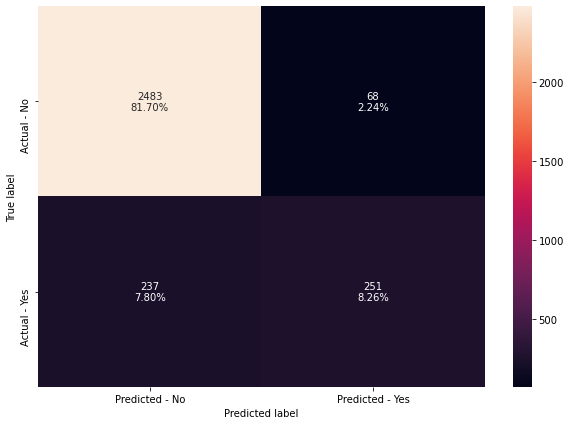

In [56]:
#Calculating different metrics
print(metrics_func(lr, X_train_reg, X_test_reg, y_train_reg, y_test_reg))

# Creating confusion matrix
print(conf_matrix(lr, X_test_reg, y_test_reg))

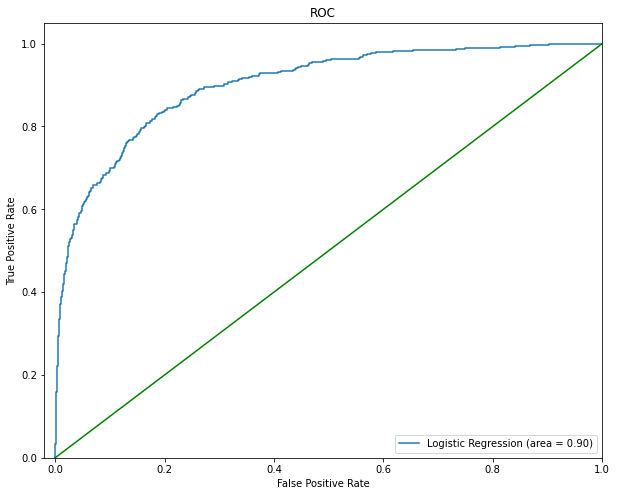

In [596]:
# We will now plot a ROC graph to see how well our model performs compared to randomly guessing 
logit_roc_auc_test = roc_auc_score(y_test_reg, lr.predict_proba(X_test_reg)[:,1]) # takes all rows and second column
fpr, tpr, thresholds = roc_curve(y_test_reg, lr.predict_proba(X_test_reg)[:,1]) # plots TP and FP values
plt.figure(figsize=(10,8))
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc_test) # two significant figures in number
plt.plot([0, 1], [0, 1],'g') # Plot diagonal in graph, we want our curve to be the farthest away from it as possible
plt.xlim([-.02, 1.0]) # limits for how much extra padding we want in graph
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.show()

In [584]:
log_odds = lr.coef_[0]
pd.DataFrame(log_odds, X_train_reg.columns, columns=['coef']).sort_values(by='coef', ascending=False).T

,Average_Amount_Per_Transaction,Contacts_Count_12_mon,Months_Inactive_12_mon,Card_Category,Income_Category,Avg_Utilization_Ratio,Dependent_count,Customer_Age,Education_Level,Credit_Limit,Months_on_book,Total_Amt_Chng_Q4_Q1,Marital_Status_Unknown,Marital_Status_Single,Total_Relationship_Count,Marital_Status_Married,Total_Ct_Chng_Q4_Q1,Average_Revolving_Credit,Gender_M
coef,1.025598,0.58214,0.469535,0.181543,0.181393,0.090884,0.082998,0.067559,0.015298,-0.022885,-0.025182,-0.058966,-0.136721,-0.211725,-0.652348,-0.667426,-0.781398,-0.810434,-0.91409


In [585]:
odds = np.exp(lr.coef_[0]) # by taking we the exponent we get the actual increase or decrease in probability associated with each variable
pd.DataFrame(odds, X_train_reg.columns, columns=['odds']).sort_values(by='odds', ascending=False).T

,Average_Amount_Per_Transaction,Contacts_Count_12_mon,Months_Inactive_12_mon,Card_Category,Income_Category,Avg_Utilization_Ratio,Dependent_count,Customer_Age,Education_Level,Credit_Limit,Months_on_book,Total_Amt_Chng_Q4_Q1,Marital_Status_Unknown,Marital_Status_Single,Total_Relationship_Count,Marital_Status_Married,Total_Ct_Chng_Q4_Q1,Average_Revolving_Credit,Gender_M
odds,2.788763,1.789865,1.59925,1.199067,1.198886,1.095142,1.08654,1.069893,1.015415,0.977375,0.975133,0.942738,0.872214,0.809187,0.520821,0.513028,0.457765,0.444665,0.400881


In [474]:
# It is important to know what this coefficients refer to, so we need to call .classes_ to know to what class these values are associated with
lr.classes_
# These refer to odds and log_odds for class 0, our majority class, that is why they are positive!

array([0, 1], dtype=int64)

- Even without any regularization, our logistic regression model performs rather well and does not overfit the data. We notice both Recall and Precision are similar in both sets. Accuracy is 88 per cent in train and test sets. Recall is 50 % in training and 52 per cent in testing. Precision is a bit higher, at 76 for training set and 79 for testing set. Our F1 score is 60 for training and 63 in testing. Let us now see what we can achieve if we include regularization, even if our model has proven to generalize well for unseen data.
- We take a look at the feature importance next. In this case we can look at the odds and log odds of each independent variable. We can corroborate some of the findings from our EDA. An increase of 1 percent (remember we took the log of this variable) Average_Amount_Per_Transaction is  associated with an increase of 2.78 per cent in the probability of being a current customer. Similarly an increase in 1 Contact with the bank in the past 12 months, is associated with an increase in the probability of being a current customer of 1.79 per cent. Card_Category and Income_Category have similar odds coefficients of 1.2 per cent. All of our coefficients are positive, and at the end of the specturm we have our Gender_M one hot ecoded variable. It looks as being a male increases the probability of being a current customer by .4 percent. Likewise, and increase in one percent (we took the log of this varibale as well) in Average_Revolving_Credit is associated with an increase in the probability of being a current customer of .46 per cent. Moreover, and as we had noted before, individuals who have been longer with the bank are more likely to stay with the bank, as portrayed by the .98 per cent increase in probability for each extra month in the book.
- As we could have expected from the performance of our model in Recall and Precision metrics, the AUC shows our model is not great. Let us compare it with the regularized version.

In [23]:
# We apply Lasso regularization, which will drive to 0 features which are not useful for the model
lr_l1 = LogisticRegression(penalty='l1', solver='saga')
lr_l1.fit(X_train_reg, y_train_reg)
lr_l1.score(X_train_reg, y_train_reg)

0.8931997742663657

Accuracy on training set :  0.8931997742663657
Accuracy on test set :  0.9006252056597565
Recall on training set :  0.5013169446883231
Recall on test set :  0.5163934426229508
Precision on training set :  0.7513157894736842
Precision on test set :  0.7924528301886793
F1 score on training set :  0.6013691416535019
F1 score on test set :  0.6253101736972705
None
None


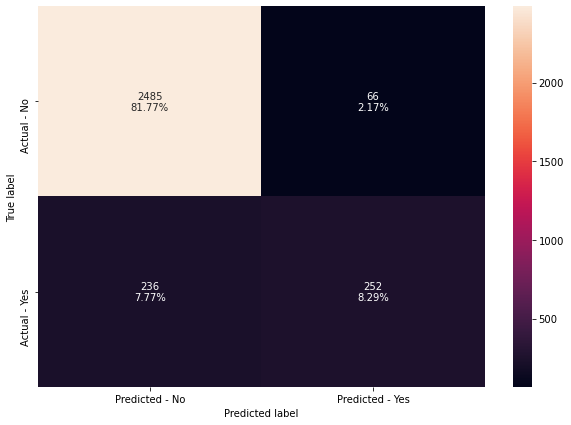

In [618]:
#Calculating different metrics
print(metrics_func(lr_l1, X_train_reg, X_test_reg, y_train_reg, y_test_reg))

# Creating confusion matrix
print(conf_matrix(lr_l1, X_test_reg, y_test_reg))

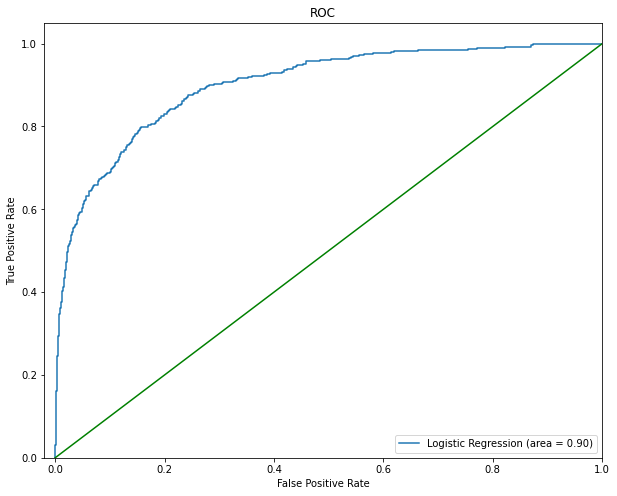

In [598]:
# We will now plot a ROC graph to see how well our model performs compared to randomly guessing 
logit_roc_auc_test = roc_auc_score(y_test_reg, lr_l1.predict_proba(X_test_reg)[:,1]) # takes all rows and second column
fpr, tpr, thresholds = roc_curve(y_test_reg, lr_l1.predict_proba(X_test_reg)[:,1]) # plots TP and FP values
plt.figure(figsize=(10,8))
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc_test) # two significant figures in number
plt.plot([0, 1], [0, 1],'g') # Plot diagonal in graph, we want our curve to be the farthest away from it as possible
plt.xlim([-.02, 1.0]) # limits for how much extra padding we want in graph
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.show()

In [588]:
log_odds = lr_l1.coef_[0]
pd.DataFrame(log_odds, X_train_reg.columns, columns=['coef']).sort_values(by='coef', ascending=False).T

,Average_Amount_Per_Transaction,Contacts_Count_12_mon,Months_Inactive_12_mon,Customer_Age,Income_Category,Avg_Utilization_Ratio,Dependent_count,Card_Category,Credit_Limit,Education_Level,Marital_Status_Unknown,Months_on_book,Total_Amt_Chng_Q4_Q1,Marital_Status_Single,Marital_Status_Married,Total_Relationship_Count,Gender_M,Total_Ct_Chng_Q4_Q1,Average_Revolving_Credit
coef,1.016631,0.579661,0.487382,0.149812,0.123994,0.114204,0.09691,0.056202,0.025076,0.000913,0.0,-0.036699,-0.049448,-0.134353,-0.543917,-0.639554,-0.729809,-0.784543,-0.847419


In [589]:
odds = np.exp(lr_l1.coef_[0]) # by taking we the exponent we get the actual increase or decrease in probability associated with each variable
pd.DataFrame(odds, X_train_reg.columns, columns=['odds']).sort_values(by='odds', ascending=False).T

,Average_Amount_Per_Transaction,Contacts_Count_12_mon,Months_Inactive_12_mon,Customer_Age,Income_Category,Avg_Utilization_Ratio,Dependent_count,Card_Category,Credit_Limit,Education_Level,Marital_Status_Unknown,Months_on_book,Total_Amt_Chng_Q4_Q1,Marital_Status_Single,Marital_Status_Married,Total_Relationship_Count,Gender_M,Total_Ct_Chng_Q4_Q1,Average_Revolving_Credit
odds,2.763866,1.785432,1.628048,1.161616,1.132009,1.12098,1.101761,1.057811,1.025393,1.000913,1.0,0.963966,0.951755,0.874281,0.58047,0.527528,0.482001,0.456328,0.428519


- Our regularized model performs quite similarly to our first model in terms of accuracy but does badly on other metrics. We see again accuracy of 89 per cent in training set and 90 per cent in test set. However, when looking at recall and Precision, our values drop a significant amount. Recall on training set is 50 and 52 on our testing set. Precision is again 76 % on training and 79 on testing set. Finally, our F1 score shows 61 for training and 63 for testing. As we mentioned, nearly identical results to the first implementation.
- However, we know our regularization did have and effect on the model because while some of the coefficients are in the same spot and have a very similar value, others have changed place. For example, in the second model we now have customer age in fourth place, and an increase in one year of age is associated with and increase in 1.16 per cent probability of being a current customer. While in the first model it the odds coefficient was 1.07 for age. Card category coefficient has also been lowered from 1.2 to 1.06. Interestingly enough, our top three varibales stay the same as before and even have almost identical coefficients. While we mentioned cases where odds coefficient values dropped, there are also cases where they increased in our regularized model. For example, the coefficient for dummy Male is now .48 vs .40. And the coefficient for dummy married increased as well to .58 from .51
- Since both models have effectively the same performance in all of our metrics, the AUC grpah looks almost the same for both mcases. They both have an AUC of .90 as well.
- While our accuracy is not terrible, we notice our recall is rather low. This is to be expected in datasets which are imbalanced. We will now try to improve model performance by implementing Upsampling and Downsampling techniques!

# Upsampling with SMOTE

In [629]:
# We will use the SMOTE technique, whoch creates synthetic samples with the help of the KNN algorithm, let us see if it can improve our Recall
up_smote = SMOTE(sampling_strategy = 1 ,k_neighbors = 5, random_state=5)   #Instantiate SMOTE
X_train_up, y_train_up = up_smote.fit_resample(X_train_reg, y_train_reg) # Fit and upsample train set
y_train_up.value_counts()

Attrition_Flag
1                 5949
0                 5949
dtype: int64

After applying our SMOTE umpsampler, we can see we now have the same amount of examples with a response of 1, or Attrited. Let us now see how well this dataset improves our model's performance.

In [630]:
lr_smote = LogisticRegression(penalty='l2', solver='saga')
lr_smote.fit(X_train_up, y_train_up)
lr_smote.score(X_train_up, y_train_up)

0.8581274163724996

Accuracy on training set :  0.8581274163724996
Accuracy on test set :  0.85357025337282
Recall on training set :  0.8466969238527483
Recall on test set :  0.7295081967213115
Precision on training set :  0.8665061070015483
Precision on test set :  0.5321375186846039
F1 score on training set :  0.8564869920081619
F1 score on test set :  0.6153846153846153
None
None


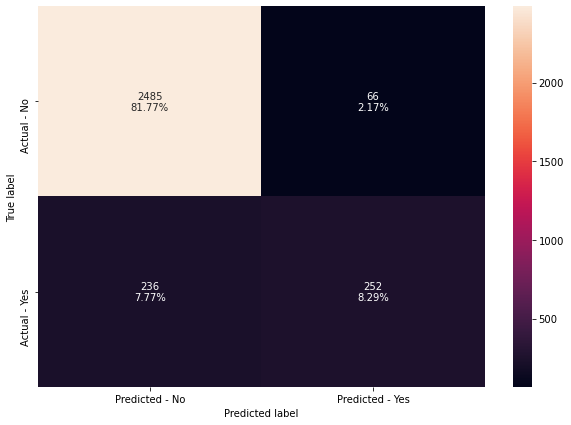

In [631]:
#Calculating different metrics
print(metrics_func(lr_smote, X_train_up, X_test_reg, y_train_up, y_test_reg))

# Creating confusion matrix
print(conf_matrix(lr_l1, X_test_reg, y_test_reg))

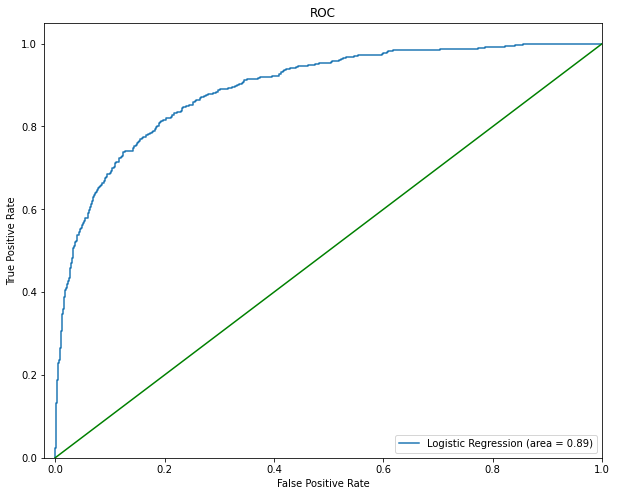

In [632]:
# We will now plot a ROC graph to see how well our model performs compared to randomly guessing 
logit_roc_auc_test = roc_auc_score(y_test_reg, lr_smote.predict_proba(X_test_reg)[:,1]) # takes all rows and second column
fpr, tpr, thresholds = roc_curve(y_test_reg, lr_smote.predict_proba(X_test_reg)[:,1]) # plots TP and FP values
plt.figure(figsize=(10,8))
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc_test) # two significant figures in number
plt.plot([0, 1], [0, 1],'g') # Plot diagonal in graph, we want our curve to be the farthest away from it as possible
plt.xlim([-.02, 1.0]) # limits for how much extra padding we want in graph
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.show()

In [633]:
log_odds = lr_smote.coef_[0]
pd.DataFrame(log_odds, X_train_up.columns, columns=['coef']).sort_values(by='coef', ascending=False).T

,Average_Amount_Per_Transaction,Contacts_Count_12_mon,Months_Inactive_12_mon,Credit_Limit,Income_Category,Dependent_count,Avg_Utilization_Ratio,Months_on_book,Total_Amt_Chng_Q4_Q1,Education_Level,Customer_Age,Card_Category,Total_Relationship_Count,Total_Ct_Chng_Q4_Q1,Average_Revolving_Credit,Gender_M,Marital_Status_Single,Marital_Status_Unknown,Marital_Status_Married
coef,1.254514,0.595563,0.580334,0.183068,0.11957,0.086864,0.070325,-0.006411,-0.025012,-0.046241,-0.093308,-0.224527,-0.658408,-0.83285,-0.866557,-0.949971,-1.935926,-2.331433,-2.332762


In [634]:
odds = np.exp(lr_smote.coef_[0]) # by taking we the exponent we get the actual increase or decrease in probability associated with each variable
pd.DataFrame(odds, X_train_reg.columns, columns=['odds']).sort_values(by='odds', ascending=False).T

,Average_Amount_Per_Transaction,Contacts_Count_12_mon,Months_Inactive_12_mon,Credit_Limit,Income_Category,Dependent_count,Avg_Utilization_Ratio,Months_on_book,Total_Amt_Chng_Q4_Q1,Education_Level,Customer_Age,Card_Category,Total_Relationship_Count,Total_Ct_Chng_Q4_Q1,Average_Revolving_Credit,Gender_M,Marital_Status_Single,Marital_Status_Unknown,Marital_Status_Married
odds,3.506133,1.814051,1.786635,1.200897,1.127012,1.090748,1.072857,0.993609,0.975299,0.954811,0.910913,0.798894,0.517675,0.434808,0.420396,0.386752,0.144291,0.097156,0.097027


- Some interesting observations to make from the performance results of our model trained on SMOTE Upsampled dataset. Firstly we notice our model has overfitted the training data, and in fact, this is and observation made in our lessons. SMOTE may induce overfitting and we can clearly see it when looking at Recall in training set of 85 % and 73 per cent in testing set. However, notice how our Recall has greatly improved compared to previous models. Precision in training set is now 87 per cent and 53 % in testing set, showing clear signs of overfitting again. Our F1 score also suffered a large overfitting effect, even if the values stayed at around the same for testing set. Training showed promise with an F1 score of 86, however when we used our model with unseen data we only achieved 62 per cent, the same as past implementations
- The coefficients of our logistic classifier have also changed but order seems to be relatively similar. We notice Average_Amount_Per_Transaction again carries the largest odds coefficient, and increase in 1 percent in avg_transactions is associated with 3.5 per cent increase in the probability of being a current customer. Notice how the next largest coefficient is around half of the previous one. Contacts_Count_12_mon now carries an odds coefficent of 1.8 per cent, followed by Months_Inactive_12_mon at 1.8 per cent as well. These are all coefficients we theorized would be important with base on our EDA findings. On the other end of the spectrum, now the coefficent for dummy Married is 10 times smaller than in previous models and only carries and odds coefficient of .09 per cent. Followed closely by the other three Marital Status dummies, Unknown and Single, at .09 and .14 respectively. Gender Male dummy has a similar odds value than in previous models, at .42 per cent. Education Level now has an odds value of .95 per cent whoch is more or less the same than in the last two cases.
- Because of the reasons outlined above, our AUC has diminished by one point. We will try other methods and see how it performs.

# Downsampling with RandomUnderSampler

In [24]:
# The SMOTE technique we implemented did not increased total model performance. While Recall was icreased, this is because out minority class numbers increased, but 
# Precision suffered a much larger loss than our Recall gain, thus, there was a total system loss. Let us now try to undersample the majority class and see if this
# technique helps us perform better

us = RandomUnderSampler()
X_us, y_us = us.fit_resample(X_train_reg, y_train_reg)
y_us.value_counts()

Attrition_Flag
1                 1139
0                 1139
dtype: int64

In [25]:
lr_us = LogisticRegression(penalty='l2', solver='saga')
lr_us.fit(X_us, y_us)
lr_us.score(X_us, y_us)

0.8187006145741879

Accuracy on training set :  0.8187006145741879
Accuracy on test set :  0.8334978611385324
Recall on training set :  0.8121158911325724
Recall on test set :  0.7909836065573771
Precision on training set :  0.8229537366548043
Precision on test set :  0.48860759493670886
F1 score on training set :  0.817498895271763
F1 score on test set :  0.6040688575899843
None
None


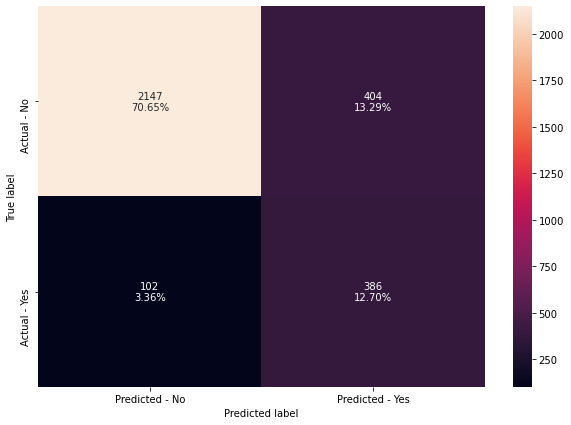

In [26]:
#Calculating different metrics
print(metrics_func(lr_us, X_us, X_test_reg, y_us, y_test_reg))

# Creating confusion matrix
print(conf_matrix(lr_us, X_test_reg, y_test_reg))

In [27]:
log_odds = lr_us.coef_[0]
pd.DataFrame(log_odds, X_us.columns, columns=['coef']).sort_values(by='coef', ascending=False).T

,Average_Amount_Per_Transaction,Months_Inactive_12_mon,Contacts_Count_12_mon,Card_Category,Income_Category,Avg_Utilization_Ratio,Dependent_count,Marital_Status_Unknown,Education_Level,Marital_Status_Single,Credit_Limit,Customer_Age,Months_on_book,Total_Amt_Chng_Q4_Q1,Marital_Status_Married,Gender_M,Total_Relationship_Count,Total_Ct_Chng_Q4_Q1,Average_Revolving_Credit
coef,1.352398,0.547353,0.515867,0.298833,0.062957,0.059236,0.015934,0.01184,0.008154,0.005084,0.001376,-0.000383,-0.023173,-0.086892,-0.300637,-0.417295,-0.515822,-0.594117,-0.738819


In [29]:
odds = np.exp(lr_us.coef_[0]) # by taking we the exponent we get the actual increase or decrease in probability associated with each variable
pd.DataFrame(odds, X_us.columns, columns=['odds']).sort_values(by='odds', ascending=False).T

,Average_Amount_Per_Transaction,Months_Inactive_12_mon,Contacts_Count_12_mon,Card_Category,Income_Category,Avg_Utilization_Ratio,Dependent_count,Marital_Status_Unknown,Education_Level,Marital_Status_Single,Credit_Limit,Customer_Age,Months_on_book,Total_Amt_Chng_Q4_Q1,Marital_Status_Married,Gender_M,Total_Relationship_Count,Total_Ct_Chng_Q4_Q1,Average_Revolving_Credit
odds,3.866687,1.728671,1.675089,1.348285,1.064981,1.061025,1.016062,1.011911,1.008187,1.005097,1.001377,0.999617,0.977093,0.916776,0.740347,0.658827,0.59701,0.55205,0.477678


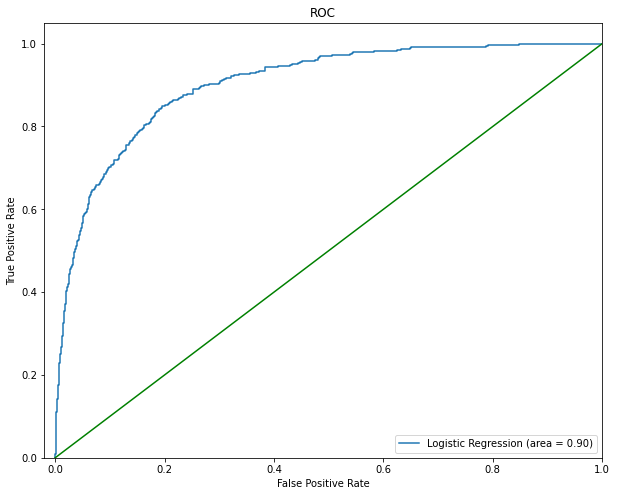

In [30]:
# We will now plot a ROC graph to see how well our model performs compared to randomly guessing 
logit_roc_auc_test = roc_auc_score(y_test_reg, lr_us.predict_proba(X_test_reg)[:,1]) # takes all rows and second column
fpr, tpr, thresholds = roc_curve(y_test_reg, lr_us.predict_proba(X_test_reg)[:,1]) # plots TP and FP values
plt.figure(figsize=(10,8))
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc_test) # two significant figures in number
plt.plot([0, 1], [0, 1],'g') # Plot diagonal in graph, we want our curve to be the farthest away from it as possible
plt.xlim([-.02, 1.0]) # limits for how much extra padding we want in graph
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.show()

- We see yet another drop in performance from our initial Logistic Classifier implementation without any type of tuning. Accuracy in training set is 82 per cent, and it testing is somewhat higher, at 83 per cent. Recall has certainly increased, in training set we now achieve 81 per cent and 79 in testing set. However, the next two metrics show out model is perhaps overfitting a bit, since Precision is 82 on training set but much lower in testing set, at 49 %. Because of that difference in performance, F1 for our training set is 82 per cent but 60 per cent in our testing set.
- Yet again, the top three varibales with largest odds value are the same as before, Average_Amount_Per_Transaction, Months_Inactive_12_mon and Contacts_Count_12_mon, with odds coefficients of 3.87, 1.7 and 1.7 respectively. We then see Card_Category with 1.4 per cent per each increase in card tier. Income category shows an odds increase of 1.1 per cent per each tier increase. Interestingly enough, at the lower end of odds values, we no longer see Marital Status. We now have Average_Revolving_Credit, with a value of .47, which is 5 times larger than Marital_Status_Married in past models. Followed closely by Total_Ct_Chng_Q4_Q1, at .55 per cent increase in odds per 1 percent increase in value. Total_Relationship_Count is associated with a .6 per cent odds increase and we see again  Gender_M with a higher odds value of .66 for that dummy variable.
- The AUC plot looks almost identical to previous models. In fact, all three models have an area of .9 +- .01. While Undersampling and Oversampling techniques allowed us to increase Recall, we suffered a loss in Precision in both cases, and saw some overfitting even with regularization.

# Downsampling with T-Links

In [464]:
# There is another undersampling technique we will implement, whoch is Tomek Links Undersampling. In theory, we will get rid of majority class examples near the 
# decision boundry, which should make classification easier for our model. Let us check if this is the case
tl = TomekLinks()
X_tl, y_tl = tl.fit_resample(X_train_reg, y_train_reg)
y_tl.value_counts()
# Notice only 240 observations from the majority class were removed

Attrition_Flag
0                 5753
1                 1139
dtype: int64

In [465]:
y_train_reg.value_counts()

Attrition_Flag
0                 5949
1                 1139
dtype: int64

In [466]:
lr_tl = LogisticRegression(penalty='l2', solver='saga')
lr_tl.fit(X_tl, y_tl)
lr_tl.score(X_tl, y_tl)

0.8943702843876958

Accuracy on training set :  0.8943702843876958
Accuracy on test set :  0.8996380388285621
Recall on training set :  0.52414398595259
Recall on test set :  0.5327868852459017
Precision on training set :  0.7624521072796935
Precision on test set :  0.771513353115727
F1 score on training set :  0.6212278876170656
F1 score on test set :  0.6303030303030304
None
None


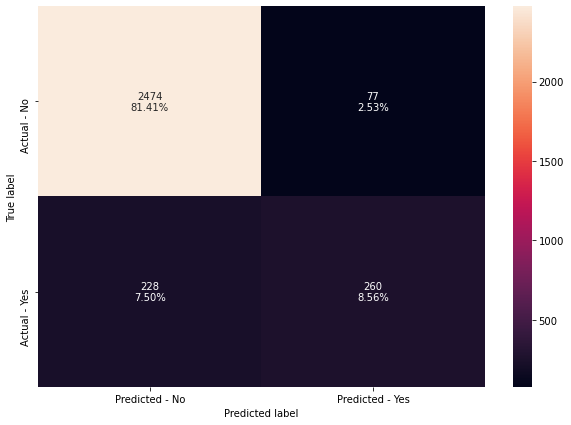

In [467]:
#Calculating different metrics
print(metrics_func(lr_tl, X_tl, X_test_reg, y_tl, y_test_reg))

# Creating confusion matrix
print(conf_matrix(lr_tl, X_test_reg, y_test_reg))

In [468]:
log_odds = lr_tl.coef_[0]
pd.DataFrame(log_odds, X_tl.columns, columns=['coef']).sort_values(by='coef', ascending=False).T

,Average_Amount_Per_Transaction,Contacts_Count_12_mon,Months_Inactive_12_mon,Customer_Age,Income_Category,Avg_Utilization_Ratio,Dependent_count,Card_Category,Credit_Limit,Education_Level,Marital_Status_Unknown,Months_on_book,Total_Amt_Chng_Q4_Q1,Marital_Status_Single,Marital_Status_Married,Total_Relationship_Count,Gender_M,Total_Ct_Chng_Q4_Q1,Average_Revolving_Credit
coef,1.04585,0.593051,0.494029,0.161348,0.129233,0.128893,0.099366,0.073877,0.037884,0.001754,-0.012748,-0.038224,-0.073168,-0.141156,-0.534556,-0.652468,-0.741629,-0.809386,-0.899477


In [469]:
odds = np.exp(lr_tl.coef_[0]) # by taking we the exponent we get the actual increase or decrease in probability associated with each variable
pd.DataFrame(odds, X_tl.columns, columns=['odds']).sort_values(by='odds', ascending=False).T

,Average_Amount_Per_Transaction,Contacts_Count_12_mon,Months_Inactive_12_mon,Customer_Age,Income_Category,Avg_Utilization_Ratio,Dependent_count,Card_Category,Credit_Limit,Education_Level,Marital_Status_Unknown,Months_on_book,Total_Amt_Chng_Q4_Q1,Marital_Status_Single,Marital_Status_Married,Total_Relationship_Count,Gender_M,Total_Ct_Chng_Q4_Q1,Average_Revolving_Credit
odds,2.845815,1.809501,1.638906,1.175093,1.137956,1.137568,1.10447,1.076675,1.038611,1.001755,0.987333,0.962498,0.929444,0.868353,0.58593,0.520759,0.476337,0.445131,0.406782


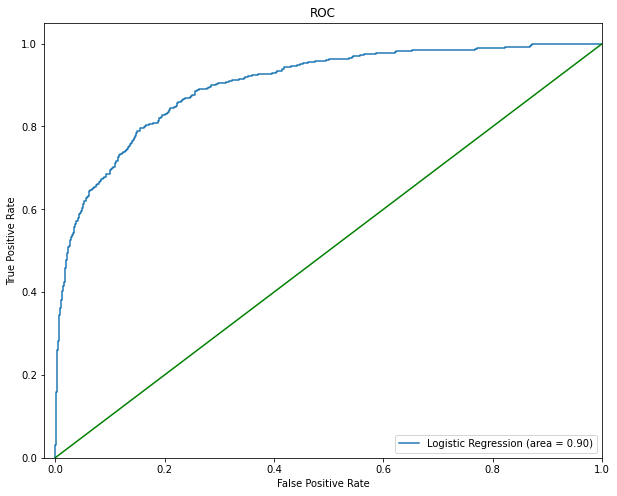

In [470]:
# We will now plot a ROC graph to see how well our model performs compared to randomly guessing 
logit_roc_auc_test = roc_auc_score(y_test_reg, lr_tl.predict_proba(X_test_reg)[:,1]) # takes all rows and second column
fpr, tpr, thresholds = roc_curve(y_test_reg, lr_tl.predict_proba(X_test_reg)[:,1]) # plots TP and FP values
plt.figure(figsize=(10,8))
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc_test) # two significant figures in number
plt.plot([0, 1], [0, 1],'g') # Plot diagonal in graph, we want our curve to be the farthest away from it as possible
plt.xlim([-.02, 1.0]) # limits for how much extra padding we want in graph
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.show()

- As one would expect, by removing the examples of the majority class that are close to the examples of the minority class, the algorithm is capable of better differentiating between the two classes. This results in an increase in accuracy of our model, which now achieves 89 per cent in both testing and training sets (When compared to previous over/undersampling technqiues). Recall has also been improved to 53 per cent in test set, compared to 52 in our first implementation. Notice the change is not as extreme as with SMOTE and Random Undersampling, where Recall increased to 80 per cent. However, in those cases, the models suffered from pronounced overfit, specially when looking at Precision. And I theorize this is because in those methods we either used less examples (which lead to loss of information), or created too many examples (which lead to overfit). On the other hand, precision in this model is again the same in both training and testing data, at 77 per cent. We are able to achieve and F1 score of 63.
- Interestingly enough, we do see different odds and log odds values for our different variables, although the hierarchy order has not changed much. For example, we still have Average_Amount_Per_Transaction, Contacts_Count_12_mon and Months_Inactive_12_mon as our top three variables whoch increase log odds by the most, at 2.8, 1.8 and 1.6 per cent respectively. There is not such a high difference as with past techniques. Perhaps this has to do with the fact that the dataset was slightly changed (only deleted 240 observations). Our 2 least important features are also the same as in previous implementations, these are Average_Revolving_Credit and Total_Ct_Chng_Q4_Q1, with odds of .4 and .44 respectively.
- AOC is better than with our RandomUnderSampling technique, at .9 vs .89.

# Default Implementation with class_weight = 'balanced'

In [32]:
# Let us see how a vanilla implementation with weight_class = 'balanced' will perform
lr_b = LogisticRegression(penalty='none', class_weight = 'balanced')
lr_b.fit(X_train_reg, y_train_reg)
lr_b.score(X_train_reg, y_train_reg)

0.8268905191873589

Accuracy on training set :  0.8268905191873589
Accuracy on test set :  0.8371174728529122
Recall on training set :  0.8156277436347673
Recall on test set :  0.7848360655737705
Precision on training set :  0.4773895169578623
Precision on test set :  0.49547218628719275
F1 score on training set :  0.6022690437601297
F1 score on test set :  0.6074544012688343
None
None


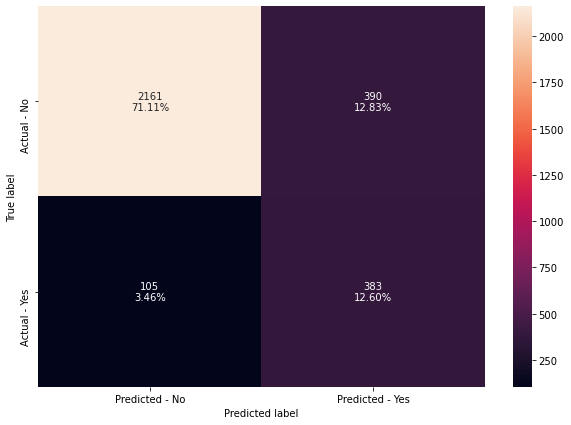

In [33]:
#Calculating different metrics
print(metrics_func(lr_b, X_train_reg, X_test_reg, y_train_reg, y_test_reg))

# Creating confusion matrix
print(conf_matrix(lr_b, X_test_reg, y_test_reg))

- As expected, when activating class weights in our vanilla model, we get very similar results to our Upsampling and Downsampling set performance. This makes sense since the three techniques are effectively doing the same thing but by different ways.

# Bagging Classfiers

# Decision Tree

In [83]:
# Since we are no longer dealing with Linear models, we will use another training and test set without dropping the columns with high VIF
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=9, stratify=y)

In [84]:
# Decision Tree
dt = DecisionTreeClassifier(random_state=5, class_weight = 'balanced') # we first implement the tree without any hyperparameter tuning
# Since we are longer using Upsampling and Downsampling, we use built in option for balanced weights
dt.fit(X_train, y_train)
dt.score(X_train, y_train)

1.0

Accuracy on training set :  1.0
Accuracy on test set :  0.9299111549851925
Recall on training set :  1.0
Recall on test set :  0.7725409836065574
Precision on training set :  1.0
Precision on test set :  0.7870563674321504
F1 score on training set :  1.0
F1 score on test set :  0.7797311271975181
None
None


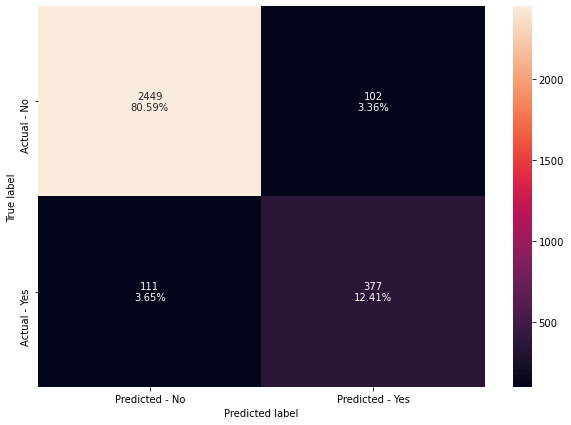

In [85]:
# As is common with non-regularized trees, we get an accuracy of 1. Lets see how it performs on Recall and Precision
print(metrics_func(dt, X_train, X_test, y_train, y_test))

# Creating confusion matrix
print(conf_matrix(dt, X_test, y_test))

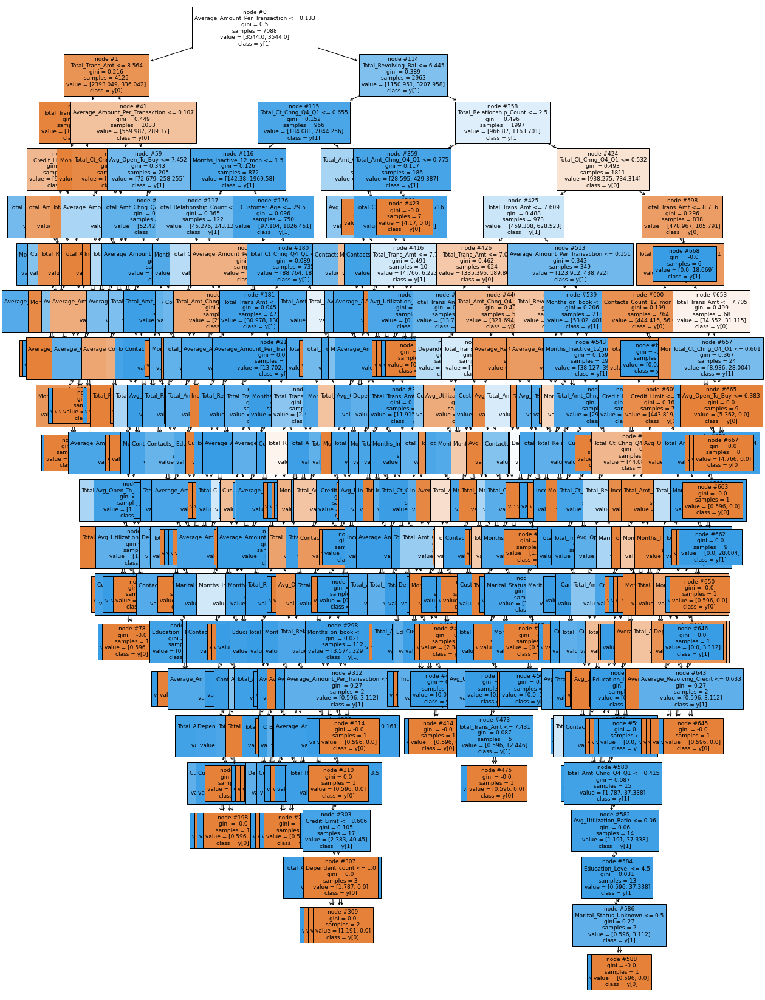

In [86]:
plt.figure(figsize=(20,30))
tree.plot_tree(dt,feature_names=list(X.columns),filled=True,fontsize=9,node_ids=True,class_names=True)
plt.show()

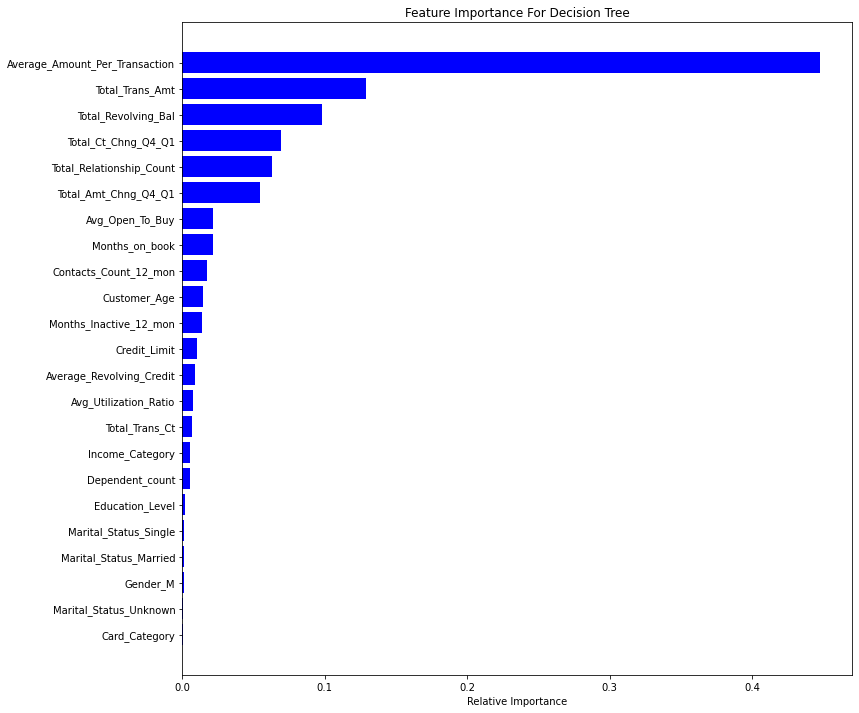

In [87]:
features = X_train.columns # Feature names
indices = np.argsort(dt.feature_importances_) # Sort values in descending order

plt.figure(figsize=(12,12))
plt.title('Feature Importance For Decision Tree')
plt.barh(range(X_train.shape[1]), dt.feature_importances_[indices], color='blue')
plt.yticks(range(X_train.shape[1]), [features[i] for i in indices]) # plots the names of the features on the y axis
plt.xlabel('Relative Importance')
plt.show()

- Right off the bat, this simple decision tree performs much better than our Logistic Classifier. However, we do notice certain overfitting of the data as is common with this algorithm. Accuracy, Recall and Precision are all perfect scores on training set, however, they drop to .93, .78 and .79 respectively when we show unseen data to our model.
- Our perfect scores on training set come at a very high tree compelxity cost, it is impossible to understand the cuts and separation decisions our model has made just from looking at the schema. Decision Trees are supposed to be great for understanding subgroups, however, that edge is lost when we do not control tree depth. Id this is a top performing model, we will try gridsearch in the next session.
- Looking at feature importances, from 23 available features, the bottom 10 have bearly any relative importance. Indeed, if we take a look at our top variable, which is Average_Amount_Per_Transaction, it is associated with .45 per cent of all the relative importance. Followed far behind by Total_Trans_Amount with .18 and Total_Revolving_Balance at .12. It's clear our decision tree finds numerical variables more useful for increasing homogeneity within leaf nodes since it is almost all categories which are at the bottom of our chart. Note as well, we were able to predict the top variable as very important and the last one as not very important by looking at our Education_Level, Avg_Transaction and Response varibale chart in our preliminary EDA.

# Random Forest

Accuracy on training set :  1.0
Accuracy on test set :  0.9536031589338598
Recall on training set :  1.0
Recall on test set :  0.7786885245901639
Precision on training set :  1.0
Precision on test set :  0.9200968523002422
F1 score on training set :  1.0
F1 score on test set :  0.8435072142064373


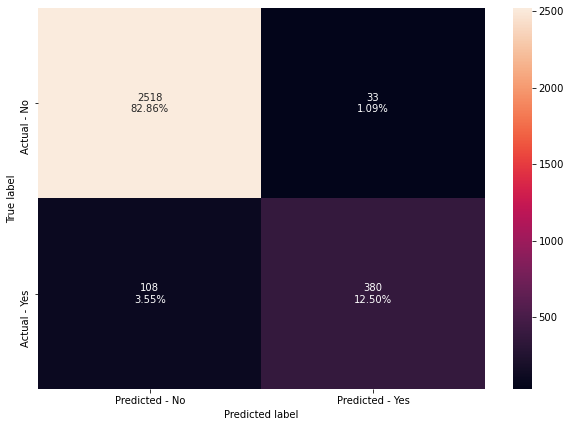

In [115]:
# We will now implement a default random forest and see its peformance
# Initiate model
rf = RandomForestClassifier(random_state= 3, class_weight = 'balanced')
rf.fit(X_train,y_train)

metrics_func(rf, X_train, X_test, y_train, y_test) # Use our predefined function to get important scores and show confusion matrix
conf_matrix(rf, X_test, y_test)

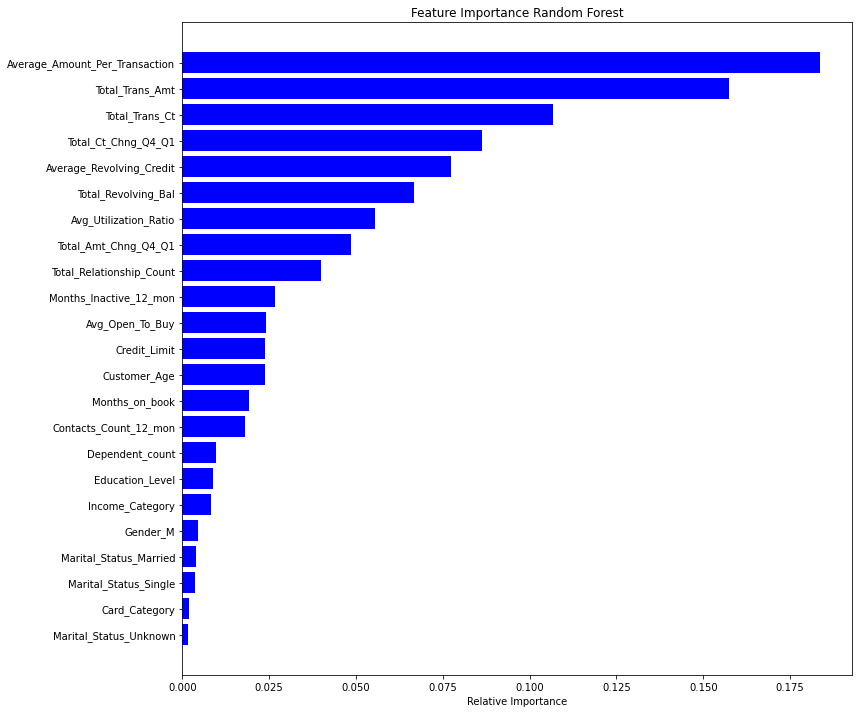

In [117]:
features = X_train.columns # Feature names
indices = np.argsort(rf.feature_importances_) # Sort values in descending order

plt.figure(figsize=(12,12))
plt.title('Feature Importance Random Forest')
plt.barh(range(X_train.shape[1]), rf.feature_importances_[indices], color='blue')
plt.yticks(range(X_train.shape[1]), [features[i] for i in indices]) # plots the names of the features on the y axis
plt.xlabel('Relative Importance')
plt.show()

- Let us first take a look at model metrics. We see again a perfect score of 100 per cent in all 4 main metrics, Accuracy, Recall, Precision and F1 score. Again, nothing too surprising as it is clear our model is overfitting the data. When we look at accuaracy for testing set, it has gone down by just 5 per cent, however, Recall dimished to 78 %. Precision has also taken a hit on unseen data, giving a value of 92 per cent, so not as large a deviatio as with Recall. F1 one score is somewhat in the middle, with 84 per cent on testing set.
- Feature importances for our Random Forest are much more balance than in our Decision Tree. Our top independent variable is still the same, Average_Amount_Per_Transaction but with half the relative importance as in DT, at .2, followed again by Total_Trasns_Amt, at .160. We see in third place Total_Ct_Chng_Q4_Q1 but it has a much lower imortance coefficient than the first 2, at .9. We still notice all numerical variables to come before any categorical values. In fact, Education_Level, Income_Category, Gender_M, and all Marital_Status come in last, with relative importance ranging from .001 to .01. In the middle we see variables such as Avg_Open_To_Buy, Customer_Age, Months_Inactive at values of around .02.

# Bagging Classifier

In [118]:
# We will now implement a bagging classifier with default paramters, and use Decision Trees as our estimators
bagging_clf=BaggingClassifier(random_state=12)
bagging_clf.fit(X_train,y_train)

bagging_clf.score(X_train, y_train)

0.9977426636568849

Accuracy on training set :  0.9977426636568849
Accuracy on test set :  0.9562356038170451
Recall on training set :  0.9868305531167691
Recall on test set :  0.819672131147541
Precision on training set :  0.9991111111111111
Precision on test set :  0.898876404494382
F1 score on training set :  0.9929328621908128
F1 score on test set :  0.857449088960343
None
None


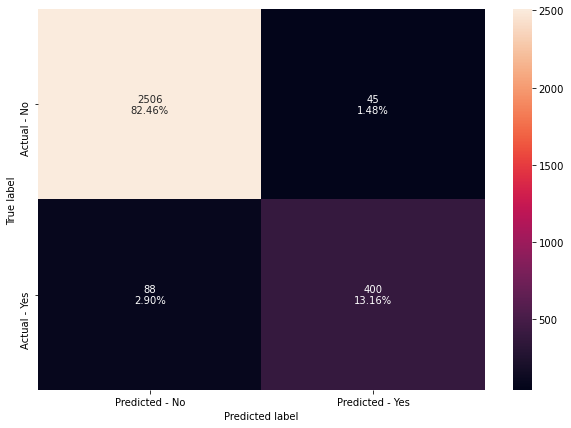

In [119]:
print(metrics_func(bagging_clf, X_train, X_test, y_train, y_test))

# Creating confusion matrix
print(conf_matrix(bagging_clf, X_test, y_test))

- Preliminary performance results for our default bagging classifier are rather promising. Compared to our Random Forest, we still see some degree of overfit as shown by Recall and Precision metric, but is lower than in RF. Recall in training set is 99 per cent and drops to 82 percent testing dataset. Precison on training set is 100 per cent when rounding up, and falls to 90 per cent on testing data. Since we don't have such a strong loss of Recall as in our Random Forest, our F1 scores are higher. We notice F1 for training set at 100 per cent when rounding up, and 86 per cent on unseen data. Depending on how well our other boosting algorithms perform, we may be able to deal with overfitting by tuning hyperparameters such as tree depth and the independent variable subspace.

# Boosting Classifiers

# AdaBoost

In [120]:
# We will now implement an AdaBoost classifier, which is a sequential model that learns by giving higher weights to misclassfied examples in each iteration
adb = AdaBoostClassifier(random_state=10)
adb.fit(X_train,y_train)

adb.score(X_train,y_train)

0.9641647855530474

Accuracy on training set :  0.9641647855530474
Accuracy on test set :  0.9591971043106285
Recall on training set :  0.8674275680421423
Recall on test set :  0.860655737704918
Precision on training set :  0.9055912007332723
Precision on test set :  0.8823529411764706
F1 score on training set :  0.8860986547085202
F1 score on test set :  0.8713692946058091


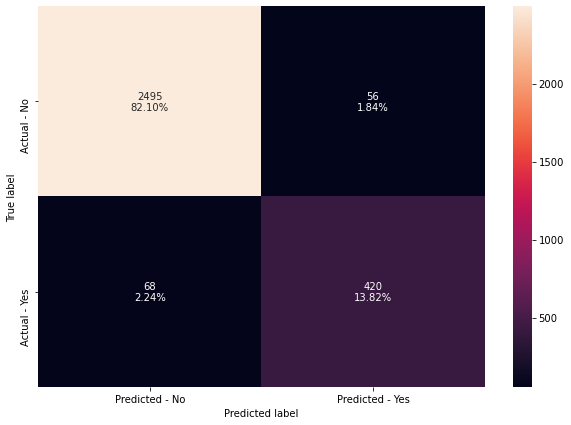

In [121]:
metrics_func(adb, X_train, X_test, y_train, y_test)

conf_matrix(adb, X_test, y_test)

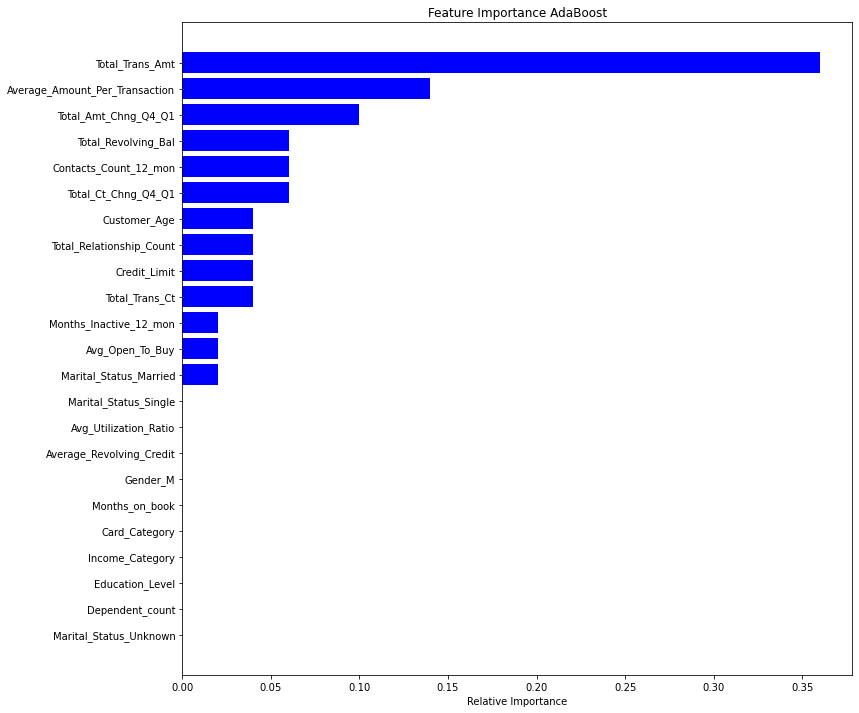

In [123]:
features = X_train.columns # Feature names
indices = np.argsort(adb.feature_importances_) # Sort values in descending order

plt.figure(figsize=(12,12))
plt.title('Feature Importance AdaBoost')
plt.barh(range(X_train.shape[1]), adb.feature_importances_[indices], color='blue')
plt.yticks(range(X_train.shape[1]), [features[i] for i in indices]) # plots the names of the features on the y axis
plt.xlabel('Relative Importance')
plt.show()

- We have some exciting preliminary results. The first thing I noticed when looking at the results was the fact metrics on all 4 main categories are similar in both testing and training set, that tells us our model is generalizing well on unseen data. Accuracy on training set is 96 percent as well as on training set. Recal is a percentage point higher on training set than on testing set, 87 per cent vs 86 per cent. Precision is also high on both cases, with 91 per cent on training set and 88 per cent on testing set. Since our model did well on both Recall and Precision, it is surprise we get F1 score of 89 per cent in training set and 87 per cent on testing set.
- Looking at our Feature Importance map, we notice a total of 10 features have a value of 0, they are not really useful for predicting whether the client attrited or is a current customer. It comes at no surprise that our categorical variables are all in that group, except for Marital_Status_Married Dummy. Total_Trans_Amt is at the top, with a relative importance of .35, followed far behind by our own feature Average_Amount_Per_Transaction with a value of .16. We then notice Total_Amount change in quarter 4 vs first quarter with a value of .11. Interestingly, the next three features, Total_Revolving_Bal, Contacts_Ct_12_mon and Total_Ct change between quarters, all have the same relative importance of .07. We then see another 4 with value .05 where we find Age, Relationship_Ct, Credit_Limit and Total_Trans_Ct. Certainly much different hierarchy and values than in our bagging classifiers.

# Gradient Boosting

In [431]:
# The next step is to implement a gradient boosting classfier, which fits each iteration os stubs on the previous estimator's errors.
gb = GradientBoostingClassifier(random_state=20)
gb.fit(X_train,y_train)

gb.score(X_train,y_train)

0.9768623024830699

Accuracy on training set :  0.9768623024830699
Accuracy on test set :  0.9621586048042119
Recall on training set :  0.887620719929763
Recall on test set :  0.8422131147540983
Precision on training set :  0.9656160458452722
Precision on test set :  0.9153674832962138
F1 score on training set :  0.9249771271729185
F1 score on test set :  0.8772678762006403


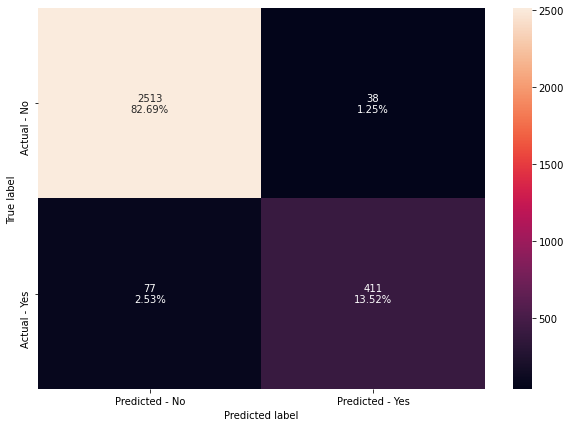

In [432]:
metrics_func(gb, X_train, X_test, y_train, y_test)

conf_matrix(gb, X_test, y_test)

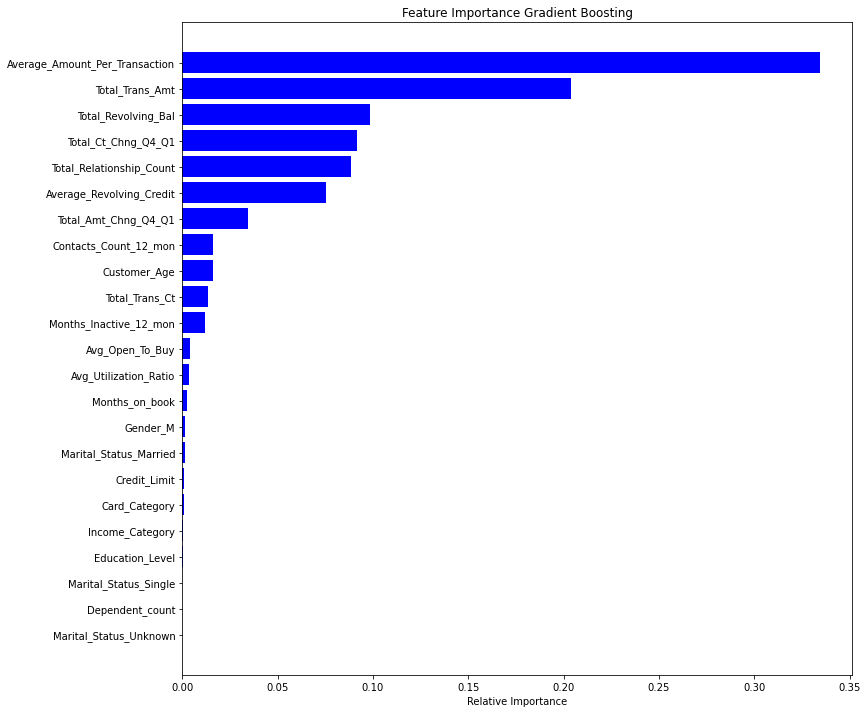

In [133]:
features = X_train.columns # Feature names
indices = np.argsort(gb.feature_importances_) # Sort values in descending order

plt.figure(figsize=(12,12))
plt.title('Feature Importance Gradient Boosting')
plt.barh(range(X_train.shape[1]), gb.feature_importances_[indices], color='blue')
plt.yticks(range(X_train.shape[1]), [features[i] for i in indices]) # plots the names of the features on the y axis
plt.xlabel('Relative Importance')
plt.show()

- It looks as our Gradient Boosting model also did very well. However, unlike our AdaBoost algorithm, it seems to be overfitting the data by a small margin. While accuracy is 98 for testing set and 96 for training set, when we take a look at Recall we notice 89 per cent on training set but 84 per cent on testing data. It is not much, but certainly more than in our previous Boosting model, much less compared to our bagging implementations. Precision is at 97 per cent on training set and 92 % on unseen data. Since both Recall and Precision are high, we get an F1 score of 92 in training data and 88 is testing set.
- Interestingly, the first two features are reversed when compared to AdaBoost. The feature we created, Avg_Amt_Per_Trans has a relative importance of .34 while Total_Trans_Amt is aat 22 per cent. We then have Total_Revolving_Balance, Total_Ct_Chng per quarter and Total_Relationship_ct at similar level of importance, hovering at around .8 - .10. While we don't have as many features with values 0 as with Adaboost (which might be the reason our model over fit the data a little bit), we do see again our categorical values at the end of the tail. We did notice little variance when looking at our percentage bar plots, so that might explain it.

# XGBoost

In [129]:
# Our final Boosting algorithm is XGBoost, a highly efficient version of Gradient Boosting and can parallelize its estimators training. Let us see how it performs!
xgb = XGBClassifier(random_state=45, eval_metric='logloss')
xgb.fit(X_train,y_train)

xgb.score(X_train,y_train)

1.0

Accuracy on training set :  1.0
Accuracy on test set :  0.970714050674564
Recall on training set :  1.0
Recall on test set :  0.889344262295082
Precision on training set :  1.0
Precision on test set :  0.9253731343283582
F1 score on training set :  1.0
F1 score on test set :  0.9070010449320794


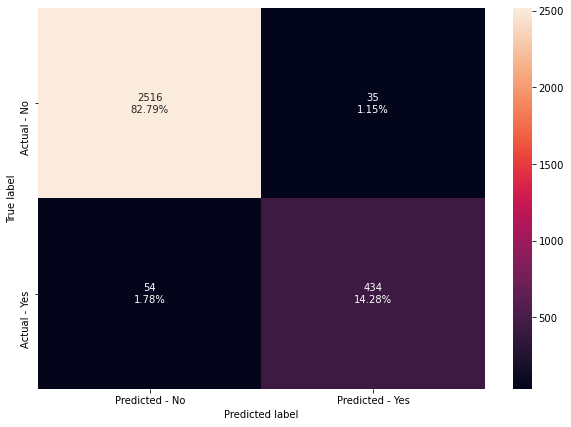

In [130]:
metrics_func(xgb, X_train, X_test, y_train, y_test)


conf_matrix(xgb, X_test, y_test)

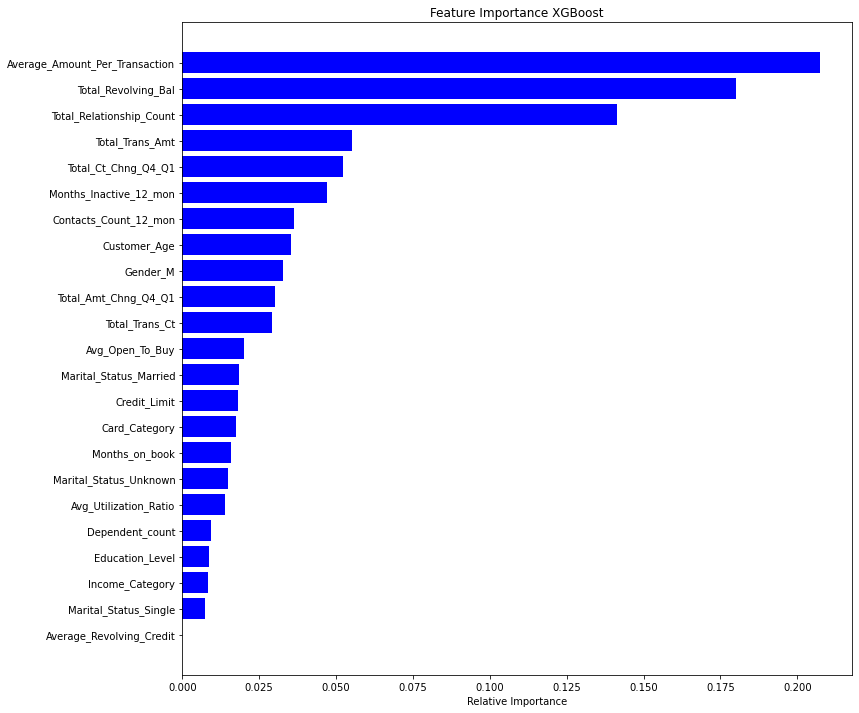

In [132]:
features = X_train.columns # Feature names
indices = np.argsort(xgb.feature_importances_) # Sort values in descending order

plt.figure(figsize=(12,12))
plt.title('Feature Importance XGBoost')
plt.barh(range(X_train.shape[1]), xgb.feature_importances_[indices], color='blue')
plt.yticks(range(X_train.shape[1]), [features[i] for i in indices]) # plots the names of the features on the y axis
plt.xlabel('Relative Importance')
plt.show()

- Our XGBoost algorithm performed well but we see some overfit of the data. It is not as noticeable when looking at the accurcy metric, with a score of 1 for training set and lightly lower at 97 per cent for unseen data. But it is more clear when we see Recall in training set achieved 100 % and only 89 per cent on testing data. There is also some overfit when looking at Precision, which again achieved a perfect score of 1.0 but 93 per cent on testing data. Our F1 score is 100 per cent as one would expect, for trainign set and 91 per cent for our testing set. We notice all features being used, so again, this could be the reason behind our slight overfit, let us now take a look at feature importance.
- On first place, we again have Average_Amount_Per_Transaction, which has been a popular feature amongst our models. It has a relative importance of .22, followed by Total_Revolving_Bal at 18 per cent and Total_Relationship_Count at .13. From there we see a stong diminish in relative importance values, with Total_Trans_Amt only showing .06, Total_Ct_Chng in quarters at .04 and Months_Inactive with .35. We do notice that the second feature we engineered is at the far end of the spectrum and holds no importance for this XGBoost model. Following close behind we have our categorical features again, which really don't seem to have been used much by any of our models thus far. We do notice Gender_M a bit higher, but it is still only at .026 importance relative to other features.

# Comparing All Models

In [136]:
models = [dt, rf, bagging_clf, adb, gb, xgb]
met = []
for i in models:
    met.append(comp_func(i))
    
df_total_scores = pd.DataFrame.from_records(met, columns=['Acc_Train', 'Acc_Test', 'Recall_Train', 'Recall_Test', 'Prec_Train', 'Prec_Test', 'F1_Train', 'F1_Test'], 
                          index = ['dt', 'rf', 'bagging_clf', 'adb', 'gb', 'xgb'])
df_total_scores.sort_values(by='Recall_Test', ascending=False)

,Acc_Train,Acc_Test,Recall_Train,Recall_Test,Prec_Train,Prec_Test,F1_Train,F1_Test
xgb,1.000000,0.970714,1.000000,0.889344,1.000000,0.925373,1.000000,0.907001
adb,0.964165,0.959197,0.867428,0.860656,0.905591,0.882353,0.886099,0.871369
gb,0.976862,0.962159,0.887621,0.842213,0.965616,0.915367,0.924977,0.877268
bagging_clf,0.997743,0.956236,0.986831,0.819672,0.999111,0.898876,0.992933,0.857449
rf,1.000000,0.953603,1.000000,0.778689,1.000000,0.920097,1.000000,0.843507
dt,1.000000,0.929911,1.000000,0.772541,1.000000,0.787056,1.000000,0.779731


# Model Improvement with Exhaustive GridSearch for Hyperparameter Selection
- We will use our top performing models in Testing Recall since we are dealing with an unbalanced dataset. The bank would rather reduce the amount of False Negatives in the model, or in other words, people who are classified as Current Customers but in reality they have attrited the Credit Card service. This makes logical sense from a business stand point since the Bank can focus on marketing techniques which could persuade clients to keep their credits cards. On the other hand, even if Precison is not too high, which means large numbers of False Positives, while the bank may incur on some loses by focusing on people who already are thinking on keeping their card, this could also act as an up-selling technique, where the current customer is offered more services or a better Credit Card tier. In any case, our top performing models have similar Precision scores as their Recall, and thus, it is safe to assume the best course of action is to tune the following models:
   - XGBoost
   - AdaBoost
   - Gradient Boosting
- Furthermore, clearly our bagging algorithms have overfit the data by a large margin, so this also pushes us towards selecting our Boosting algorithms instead.
- Note since our top peforming model is of the kind pipeline, we will not be showing feature importances in the next section, however, rest assured they are practically the same as I have extracted the best_parameters model, trained in and obtained the same results as above.

In [175]:
# We need to create another test, train split without standardized columns
X_train_pipe, X_test_pipe, y_train_pipe, y_test_pipe = train_test_split(X, y, test_size=0.30, random_state=9, stratify=y)

In [211]:
# Instead of directly performing GridSearch, we will create a pipeline to standardize our data. This is because Cross Validation will create testing and training
# sets every time it is called, and we require our testing set to only be transformed by the standardscaler and not fitted, thus avoiding data leakage

from sklearn.compose import ColumnTransformer # Allows us to select which columns to standardize, and which to normalize.
from sklearn.preprocessing import MinMaxScaler # Since we have ordinal categorical variables, we don't want to standardize them, instead, we will normalize them.

def transformer_pipeline(model):
    numeric = ['Customer_Age', 'Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
    'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio', 'Average_Revolving_Credit',
    'Average_Amount_Per_Transaction']

    ordinal_categorical = ['Education_Level', 'Income_Category', 'Card_Category']

    pre_process = ColumnTransformer(
    transformers=[
        ('numerical', StandardScaler(), numeric),
        ('ordinalcat', MinMaxScaler(feature_range = (-3,3)), ordinal_categorical)], remainder='passthrough')
    # We will normalize from a scale of -3 to 3 to further make scales within our data even more similar.
    
    # We now create a pipeline that includes our preprocessing steps as well as the model we want to implement
    pipe = Pipeline(steps = [('pre', pre_process), ('model', model)])
    
    
    return(pipe)

# This custom function will allow us to call it instead of having to copy and paste the ful code for our three models

# Gradient Boosting Cross Validated GridSearch

In [316]:
# Let us define the paramters to tune in our Gradient Boosting Algorithm
parameters = {
    'model__max_depth': np.arange(1, 5, 1), # Max depth of stubs
    "model__learning_rate":np.arange(0.1, 1.0,.2), # Model's learning rate, lower rate helps with overfitting
    "model__subsample":[0.5, 0.7, .8, .9], # The fraction of samples to use in the training of each stub
    "model__n_estimators": np.arange(100, 200, 20), # Same hyperparamter than in RF and Bagging, how many stubs to use
    "model__max_features":[0.5, 0.75, 1.0]
} ## Always remember to use the name of the step in make_pipeline followed by the hyperparamter to tune

In [ ]:
score = metrics.make_scorer(metrics.recall_score) # We would like to optimize Recall as it is in the banks best interest for the reasons outlined at the beginning 
# of this section

gd_grid = GridSearchCV(transformer_pipeline(GradientBoostingClassifier()), parameters, scoring = score, n_jobs=-1)
gd_grid = gd_grid.fit(X_train_pipe, y_train_pipe)
# If we don't specify CV, it will use by default cv = 5
# Model took 50 minutes to run GridSearch

In [241]:
gd_best_param = gd_grid.best_estimator_
gd_grid.best_estimator_

Pipeline(steps=[('pre',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('numerical', StandardScaler(),
                                                  ['Customer_Age',
                                                   'Dependent_count',
                                                   'Total_Relationship_Count',
                                                   'Months_Inactive_12_mon',
                                                   'Contacts_Count_12_mon',
                                                   'Credit_Limit',
                                                   'Total_Revolving_Bal',
                                                   'Avg_Open_To_Buy',
                                                   'Total_Amt_Chng_Q4_Q1',
                                                   'Total_Trans_Amt',
                                                   'Total_Trans_Ct',
                                         

Accuracy on training set :  0.9998589164785553
Accuracy on test set :  0.970714050674564
Recall on training set :  1.0
Recall on test set :  0.889344262295082
Precision on training set :  0.9991228070175439
Precision on test set :  0.9253731343283582
F1 score on training set :  0.9995612110574814
F1 score on test set :  0.9070010449320794


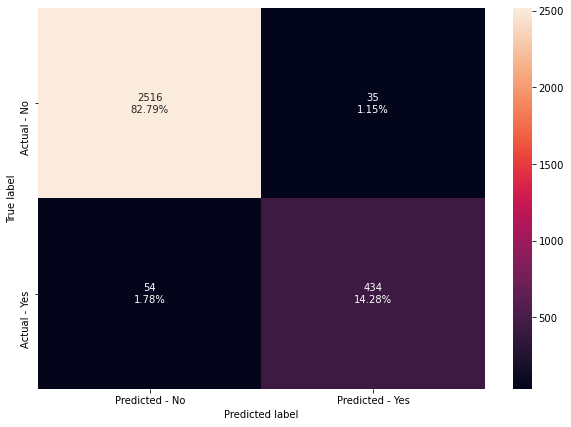

In [242]:
metrics_func(gd_best_param, X_train_pipe, X_test_pipe, y_train_pipe, y_test_pipe)
conf_matrix(gd_best_param, X_test_pipe, y_test_pipe)

In [262]:
models = [gb, gd_best_param]
met = []
for i in models:
    met.append(comp_func(i))
    
df_total_scores = pd.DataFrame.from_records(met, columns=['Acc_Train', 'Acc_Test', 'Recall_Train', 'Recall_Test', 'Prec_Train', 'Prec_Test', 'F1_Train', 'F1_Test'], 
                          index = ['gb', 'tuned_gb'])
df_total_scores.sort_values(by='Recall_Test', ascending=False)

,Acc_Train,Acc_Test,Recall_Train,Recall_Test,Prec_Train,Prec_Test,F1_Train,F1_Test
tuned_gb,0.999859,0.970714,1.000000,0.889344,0.999123,0.925373,0.999561,0.907001
gb,0.976862,0.962159,0.887621,0.842213,0.965616,0.915367,0.924977,0.877268


- First thing we notice is the fact that going through all of our hyperparamters in the full GridSearchCV took us 45 minutes, in the next 2 models we will actually instantiate a clock so we know the exact time it takes fro the process to complete. The second fact we observe is that we have increased our model peformance by a slight percentage. In factm our model now performs exactly as well as our best untuned model, the XGBoost, which is quite an accomplishment since that algorithm is highly optimized already. Our accuracy in training set is effecrively 1, and 3 percent lower for our testing set. Recall is again 1 on training set and 89 per cent on unseen data, while precision is perfect for training set and .93 on testing set. Our F1 score is high in both cases as well, 100 per cent when rounded on training set and 91 per cent on testing data. We do see a slight overfit on training data as there are relatively high discrepancies on Recall and Precision, but they are of around 10 per cent, which is manageable.
- Regarding the GridSearch we notice our best model has a learning rate of .3, with trees of maximum depth 4, using 75 per cent of all available features and 120 of these estimators which are trained with 90 per cent of all the samples.
- Compared to our default implementation, we have increased performance in all metrics. Let us focus on unseen data since it is a better measure of generalized performance. We increased Accuracy from 96 per cent to 97, not much but Recall did increase from .84 to 89 per cent!. Precision went from 92 to 93 per cent which of course caused our F1 metric to go from 88 per cent up to 91 per cent. Succesful GridSearch I would say.

# AdaBoost Cross Validated GridSearch

In [258]:
# Let us define the paramters to tune in our Gradient Boosting Algorithm
parameters = {
    "model__base_estimator":[DecisionTreeClassifier(max_depth=1),DecisionTreeClassifier(max_depth=2), DecisionTreeClassifier(max_depth=3),
                            DecisionTreeClassifier(max_depth=4), DecisionTreeClassifier(max_depth=5)], 
    # First one is actually default estimator
    "model__n_estimators": np.arange(50,150,20), # the amount of estimators to use, or 'grow' since these are stubs
    "model__learning_rate":np.arange(0.1,1.0,.2) # Also known as alpha, shrinks the contribution of subsequent trees
}

In [259]:
from timeit import default_timer as timer

start = timer()
score = metrics.make_scorer(metrics.recall_score) # We would like to optimize Recall as it is in the banks best interest for the reasons outlined at the beginning 
# of this section

ab_grid = GridSearchCV(transformer_pipeline(AdaBoostClassifier()), parameters, scoring = score, n_jobs=-1)
ab_grid = ab_grid.fit(X_test_pipe, y_test_pipe)
# If we don't specify CV, it will use by default cv = 5

end = timer()
print(end - start)
ab_grid

332.8388466000033


GridSearchCV(estimator=Pipeline(steps=[('pre',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('numerical',
                                                                         StandardScaler(),
                                                                         ['Customer_Age',
                                                                          'Dependent_count',
                                                                          'Total_Relationship_Count',
                                                                          'Months_Inactive_12_mon',
                                                                          'Contacts_Count_12_mon',
                                                                          'Credit_Limit',
                                                                          'Total_Revolving_Bal',
                      

In [260]:
ab_best_param = ab_grid.best_estimator_
ab_grid.best_estimator_

Pipeline(steps=[('pre',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('numerical', StandardScaler(),
                                                  ['Customer_Age',
                                                   'Dependent_count',
                                                   'Total_Relationship_Count',
                                                   'Months_Inactive_12_mon',
                                                   'Contacts_Count_12_mon',
                                                   'Credit_Limit',
                                                   'Total_Revolving_Bal',
                                                   'Avg_Open_To_Buy',
                                                   'Total_Amt_Chng_Q4_Q1',
                                                   'Total_Trans_Amt',
                                                   'Total_Trans_Ct',
                                         

Accuracy on training set :  0.9897009029345373
Accuracy on test set :  0.9717012175057584
Recall on training set :  0.9552238805970149
Recall on test set :  0.9016393442622951
Precision on training set :  0.9801801801801802
Precision on test set :  0.9205020920502092
F1 score on training set :  0.9675411293908405
F1 score on test set :  0.9109730848861285


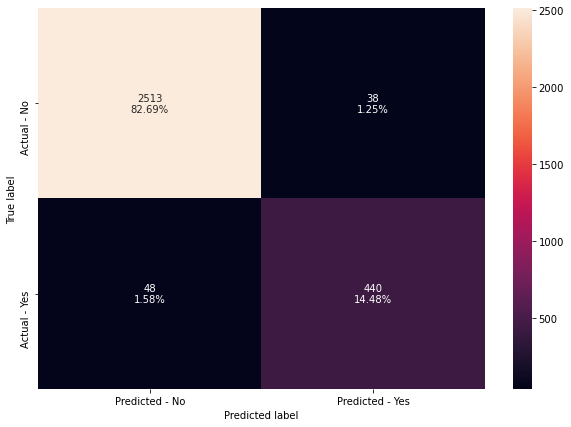

In [261]:
metrics_func(ab_best_param, X_train_pipe, X_test_pipe, y_train_pipe, y_test_pipe)
conf_matrix(ab_best_param, X_test_pipe, y_test_pipe)

In [264]:
models = [adb, ab_best_param]
met = []
for i in models:
    met.append(comp_func(i))
    
df_total_scores = pd.DataFrame.from_records(met, columns=['Acc_Train', 'Acc_Test', 'Recall_Train', 'Recall_Test', 'Prec_Train', 'Prec_Test', 'F1_Train', 'F1_Test'], 
                          index = ['ab', 'tuned_ab'])
df_total_scores.sort_values(by='Recall_Test', ascending=False)

,Acc_Train,Acc_Test,Recall_Train,Recall_Test,Prec_Train,Prec_Test,F1_Train,F1_Test
tuned_ab,0.989701,0.971701,0.955224,0.901639,0.980180,0.920502,0.967541,0.910973
ab,0.964165,0.959197,0.867428,0.860656,0.905591,0.882353,0.886099,0.871369


- Our preliminary results are very promising! We have managed to improve our AdaBoost default model, which was already performing really well. Accuracy on training set is 99 per cent while it loses two centesimal points in testing set at 97 per cent. Recall is .96 on training set and lower at 90 per cent for unseen data. Precision is 98 per cent on training and 92 percent on testing. Again, since all metrics are quite high in both cases, we are able to achieve and F1 score og 97 per cent on training data and 91 percent on testing set.
- I am suprised that our best model is the one with max_depth of 2, since the Gradient Boosting slected 4. We also notice best learning rate to be .5 and 110 estimators are used.
- Comparing our tuned and untuned versions in testing set performance, we can see we increased all levels by at least 5 - 8 per cent, quite commendable indeed. Accuracy on testing set is 96 percent with regular model version and 97 in tuned version. Recall, our metric of interest, went from 86 per cent to 90 per cent. Precision was also improved from 88 to 92 per cent. Most noticeable F1 score increased from 87 per cent all the way to 91 per cent. Succesful GridSearch!
- As we can see from our timer, this model took only a fraction of the time that the Gradient Boosting algorithm did, 332 seconds to be exact.

# XG Boost Cross Validated GridSearch

In [265]:
# Let us define the paramters to tune in our XGBoost Algorithm
parameters = {
    'model__max_depth': np.arange(1,5,1), # Max depth of stubs
    "model__learning_rate":np.arange(0.1,1.0,.1), # Model's learning rate, lower rate helps with overfitting
    "model__subsample":[0.7, .8, 1], # The fraction of samples to use in the training of each stub
    "model__n_estimators": np.arange(100,200,20), # Same hyperparamter than in RF and Bagging, how many stubs to use
    "model__max_features":[0.8,0.9,1],
}

In [271]:

start = timer() # Timer Start
score = metrics.make_scorer(metrics.recall_score) # We would like to optimize Recall as it is in the banks best interest for the reasons outlined at the beginning 
# of this section

xgb_grid = GridSearchCV(transformer_pipeline(XGBClassifier()), parameters, scoring = score, n_jobs=-1)
xgb_grid = xgb_grid.fit(X_train_pipe, y_train_pipe)
# If we don't specify CV, it will use by default cv = 5


end = timer()
print(end - start)
xgb_grid

[23:02:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "max_features" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:02:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
2483.9985933999997


GridSearchCV(estimator=Pipeline(steps=[('pre',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('numerical',
                                                                         StandardScaler(),
                                                                         ['Customer_Age',
                                                                          'Dependent_count',
                                                                          'Total_Relationship_Count',
                                                                          'Months_Inactive_12_mon',
                                                                          'Contacts_Count_12_mon',
                                                                          'Credit_Limit',
                                                                          'Total_Revolving_Bal',
                      

In [272]:
xgb_best_param = xgb_grid.best_estimator_
xgb_grid.best_estimator_

Pipeline(steps=[('pre',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('numerical', StandardScaler(),
                                                  ['Customer_Age',
                                                   'Dependent_count',
                                                   'Total_Relationship_Count',
                                                   'Months_Inactive_12_mon',
                                                   'Contacts_Count_12_mon',
                                                   'Credit_Limit',
                                                   'Total_Revolving_Bal',
                                                   'Avg_Open_To_Buy',
                                                   'Total_Amt_Chng_Q4_Q1',
                                                   'Total_Trans_Amt',
                                                   'Total_Trans_Ct',
                                         

Accuracy on training set :  1.0
Accuracy on test set :  0.9693978282329714
Recall on training set :  1.0
Recall on test set :  0.8872950819672131
Precision on training set :  1.0
Precision on test set :  0.9193205944798302
F1 score on training set :  1.0
F1 score on test set :  0.9030239833159542


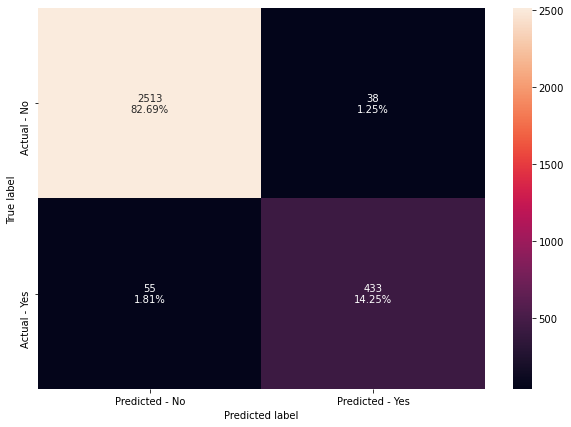

In [273]:
metrics_func(xgb_best_param, X_train_pipe, X_test_pipe, y_train_pipe, y_test_pipe)
conf_matrix(xgb_best_param, X_test_pipe, y_test_pipe)

In [274]:
models = [xgb, xgb_best_param]
met = []
for i in models:
    met.append(comp_func(i))
    
df_total_scores = pd.DataFrame.from_records(met, columns=['Acc_Train', 'Acc_Test', 'Recall_Train', 'Recall_Test', 'Prec_Train', 'Prec_Test', 'F1_Train', 'F1_Test'], 
                          index = ['xgb', 'tuned_xgb'])
df_total_scores.sort_values(by='Recall_Test', ascending=False)

,Acc_Train,Acc_Test,Recall_Train,Recall_Test,Prec_Train,Prec_Test,F1_Train,F1_Test
xgb,1.0,0.970714,1.0,0.889344,1.0,0.925373,1.0,0.907001
tuned_xgb,1.0,0.969398,1.0,0.887295,1.0,0.919321,1.0,0.903024


- We have rather interesting results from our hyperparameter grid search for XGBoost. Firstly, let us note the GridSearch took 2400 seconds to fully run. What is surprising, however, is the fact that the tuned model performed slightly worse (or more inclined to say it performed equally) as our first implementation. We see again a score of 100 percent on Accuracy, Recall, Precison and logically on F1 score when scoring our model on training data. However, our model clearly overfits the data, since Accuracy is 97 on testing set, and Recall decreases to 89 per cent as well. Precision suffers a slightly lower loss, with 92 pwe cent. Finally, we get an F1 score of 90 per cent on testing data.
- We see our tuned model uses tress with max depth of 3, learning rate of .6, subsample of 1 (so all examples), 160 estimators and 80 per cent of total features.

# Randomized Grid Search with Continous Parameter Spaces (where applicable)
- We will now try a Randomized GridSearch to look for the most optimal set of hyperparameters. Unlike our previous exhaustive Cross Validated GridSearch, we will use a continous set of hyperparameter space because this way, the Grid Search will actually sample with replacement, and the chances of obraining the best performing set of hyperparameters will also increase.
- We will also be running our clocks to then compare running times between these two functions, as well as compraing model performance.

In [385]:
from scipy.stats import randint, uniform
# Import uniform distribution to perform sampling for our random grid search for parameters between 0 and 1, and randint for parameters that must be integers

# Gradient Boosting Random Cross Validated GridSearch

In [386]:
# Let us define the paramters to tune in our Gradient Boosting Algorithm, this time with continous range values
parameters = {
    'model__max_depth': randint(1,10), # Max depth of stubs
    "model__learning_rate" : uniform(), # Model's learning rate, lower rate helps with overfitting
    "model__subsample": uniform(), # The fraction of samples to use in the training of each stub
    "model__n_estimators": randint(100,300), # Same hyperparamter than in RF and Bagging, how many stubs to use
    "model__max_features": uniform()
} ## Always remember to use the name of the step in make_pipeline followed by the hyperparamter to tune

# Notice all of the sample spaces provided must have the method .rvs in order for Randomized GridSearch to be able to sample with replacement

In [387]:
start = timer()
score = metrics.make_scorer(metrics.recall_score) # We would like to optimize Recall as it is in the banks best interest for the reasons outlined at the beginning 
# of this section

gd_randomgrid = RandomizedSearchCV(transformer_pipeline(GradientBoostingClassifier()), parameters, scoring = score, n_jobs=-1, n_iter = 100)
gd_randomgrid = gd_randomgrid.fit(X_train_pipe, y_train_pipe)
# If we don't specify CV, it will use by default cv = 5

end = timer()
print(end - start)
gd_randomgrid

314.1230188999907


RandomizedSearchCV(estimator=Pipeline(steps=[('pre',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('numerical',
                                                                               StandardScaler(),
                                                                               ['Customer_Age',
                                                                                'Dependent_count',
                                                                                'Total_Relationship_Count',
                                                                                'Months_Inactive_12_mon',
                                                                                'Contacts_Count_12_mon',
                                                                                'Credit_Limit',
                                                           

In [388]:
gbrand_best_param = gd_randomgrid.best_estimator_
gd_randomgrid.best_estimator_

Pipeline(steps=[('pre',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('numerical', StandardScaler(),
                                                  ['Customer_Age',
                                                   'Dependent_count',
                                                   'Total_Relationship_Count',
                                                   'Months_Inactive_12_mon',
                                                   'Contacts_Count_12_mon',
                                                   'Credit_Limit',
                                                   'Total_Revolving_Bal',
                                                   'Avg_Open_To_Buy',
                                                   'Total_Amt_Chng_Q4_Q1',
                                                   'Total_Trans_Amt',
                                                   'Total_Trans_Ct',
                                         

Accuracy on training set :  1.0
Accuracy on test set :  0.9720302731161566
Recall on training set :  1.0
Recall on test set :  0.8913934426229508
Precision on training set :  1.0
Precision on test set :  0.9314775160599572
F1 score on training set :  1.0
F1 score on test set :  0.9109947643979057


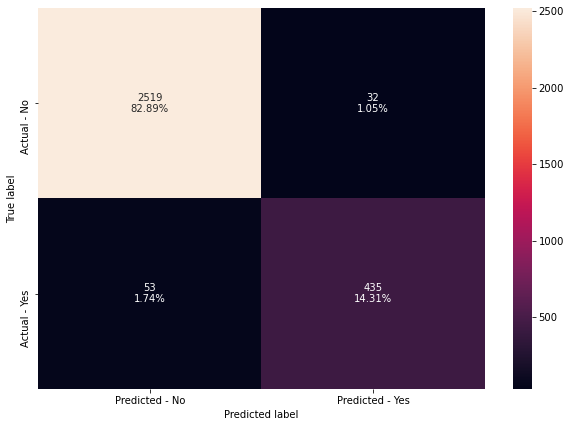

In [389]:
metrics_func(gbrand_best_param, X_train_pipe, X_test_pipe, y_train_pipe, y_test_pipe)
conf_matrix(gbrand_best_param, X_test_pipe, y_test_pipe)

In [405]:
models = [gd_best_param, gbrand_best_param]
met = []
for i in models:
    met.append(comp_func(i))
    
df_total_scores = pd.DataFrame.from_records(met, columns=['Acc_Train', 'Acc_Test', 'Recall_Train', 'Recall_Test', 'Prec_Train', 'Prec_Test', 'F1_Train', 'F1_Test'], 
                          index = ['GS_gb', 'Random_gb'])
df_total_scores.sort_values(by='Recall_Test', ascending=False)

,Acc_Train,Acc_Test,Recall_Train,Recall_Test,Prec_Train,Prec_Test,F1_Train,F1_Test
Random_gb,1.000000,0.972030,1.0,0.891393,1.000000,0.931478,1.000000,0.910995
GS_gb,0.999859,0.970714,1.0,0.889344,0.999123,0.925373,0.999561,0.907001


- First we we notice is the time difference in training. Our Cross Validated Grid Search took around 40 minutes to complete the hyperparameter serach for Gradient Boosting algorithm. On the other hand, the Randomized version took 5 minutes to run. Also notice that our hyperparamter list is actually composed of objects in memory, instead of a list. This is because everytime the RansomizedCV is ran, the object is called and the method rvs is applied, which stands for random varibale sample. This way we can sample with replacement and improve our chances of obtaining the best combination of hyperparamters.
- The RandomGridSerach achieves an accuracy of 1 in training set and slightly lower in testing set at 97 per cent. Recall shows slight overfit, with perfect score on training data but 89 per cent when using unseen data. Precision goes from 100 per cent on training set and .93 on testing set. Our F1 score is high in both instances, albeit somewhat overfit with 100 % on training set and 91 per cent on testing data.
- Our theory is tested and proven right when looking at the results in the table above, both models did equally well, however, the second implementation took about 10 per cent of the time as the exhaustive search, which shows why RandomizedGridSearch is usually preferred over full GS.
- Interestingly, the Random version of our model uses more than double the amount of estimators (271) than the first GS (120). It only uses 50 per cent of features vs .75 and larning rate is higher, at .5 vs .3. Tree depth is the same in both cases, however, at 4.

# AdaBoost Random Cross Validated GridSearch

In [393]:
# Let us define the paramters to tune in our Gradient Boosting Algorithm with Random Grid Search
parameters = {
    "model__base_estimator":[DecisionTreeClassifier(max_depth=1),DecisionTreeClassifier(max_depth=2), DecisionTreeClassifier(max_depth=3),
                            DecisionTreeClassifier(max_depth=4), DecisionTreeClassifier(max_depth=5), DecisionTreeClassifier(max_depth=6)], 
    # First one is actually default estimator
    "model__n_estimators": randint(100,200), # the amount of estimators to use, or 'grow' since these are stubs
    "model__learning_rate":uniform() # Also known as alpha, shrinks the contribution of subsequent trees
}

# Unfortunately, there is no way to provide base_estimator with a class with rsv since we must provide tree-like classes in the form of a list

In [402]:
start = timer()
score = metrics.make_scorer(metrics.recall_score) # We would like to optimize Recall as it is in the banks best interest for the reasons outlined at the beginning 
# of this section

adb_randomgrid = RandomizedSearchCV(transformer_pipeline(AdaBoostClassifier()), parameters, scoring = score, n_jobs=-1, n_iter = 40)
adb_randomgrid = adb_randomgrid.fit(X_train_pipe, y_train_pipe)
# If we don't specify CV, it will use by default cv = 5

end = timer()
print(end - start)
adb_randomgrid

172.08254309999757


RandomizedSearchCV(estimator=Pipeline(steps=[('pre',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('numerical',
                                                                               StandardScaler(),
                                                                               ['Customer_Age',
                                                                                'Dependent_count',
                                                                                'Total_Relationship_Count',
                                                                                'Months_Inactive_12_mon',
                                                                                'Contacts_Count_12_mon',
                                                                                'Credit_Limit',
                                                           

In [403]:
adbrand_best_param = adb_randomgrid.best_estimator_
adb_randomgrid.best_estimator_

Pipeline(steps=[('pre',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('numerical', StandardScaler(),
                                                  ['Customer_Age',
                                                   'Dependent_count',
                                                   'Total_Relationship_Count',
                                                   'Months_Inactive_12_mon',
                                                   'Contacts_Count_12_mon',
                                                   'Credit_Limit',
                                                   'Total_Revolving_Bal',
                                                   'Avg_Open_To_Buy',
                                                   'Total_Amt_Chng_Q4_Q1',
                                                   'Total_Trans_Amt',
                                                   'Total_Trans_Ct',
                                         

Accuracy on training set :  0.9995767494356659
Accuracy on test set :  0.9700559394537677
Recall on training set :  0.9991220368744512
Recall on test set :  0.8811475409836066
Precision on training set :  0.9982456140350877
Precision on test set :  0.9287257019438445
F1 score on training set :  0.998683633172444
F1 score on test set :  0.9043112513144058


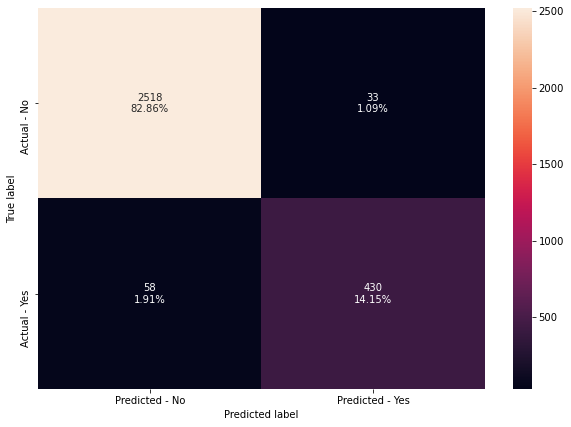

In [404]:
metrics_func(adbrand_best_param, X_train_pipe, X_test_pipe, y_train_pipe, y_test_pipe)
conf_matrix(adbrand_best_param, X_test_pipe, y_test_pipe)

In [406]:
models = [ab_best_param, adbrand_best_param]
met = []
for i in models:
    met.append(comp_func(i))
    
df_total_scores = pd.DataFrame.from_records(met, columns=['Acc_Train', 'Acc_Test', 'Recall_Train', 'Recall_Test', 'Prec_Train', 'Prec_Test', 'F1_Train', 'F1_Test'], 
                          index = ['GS_ab', 'Random_ab'])
df_total_scores.sort_values(by='Recall_Test', ascending=False)

,Acc_Train,Acc_Test,Recall_Train,Recall_Test,Prec_Train,Prec_Test,F1_Train,F1_Test
GS_ab,0.989701,0.971701,0.955224,0.901639,0.980180,0.920502,0.967541,0.910973
Random_ab,0.999577,0.970056,0.999122,0.881148,0.998246,0.928726,0.998684,0.904311


- Full Hyperparamter tuning with Grid Search took about double the time than our Random Grid Search, which came clocking in at 172 seconds. Of course, since in exhaustive Grid Search we sample without replacement and our number of estimators was relatively low (compared to other models where we pass a simple and long list of values for tree depth), our initial GS only had to look through 40 or so hp combinations. 
- While it took half the time to execute, RandomGS performed almost as well as full GS. Accuarcy on training set was 100 per cent when rounding, and 97 per cent on testing set. We notice a slight overfit from Recall results, since it achieved 100 per cent in training set but 88 per cent in testing set. Precision was again 100 per cent when rounded and somewhat lower at 93 per cent on unseen data. Our F1 score was quite good, at 90 per cent for testing set. Unsurprisingly it was a perfect score on training data.
- Looking at the hyperparameters, both models had a maximum depth of two for their estimators, a learning rate close to .5, but RandomGS used double the number of trees, at 211 vs 110

# XGBoost Random Cross Validated GridSearch

In [420]:
# Let us define the paramters to tune in our XGBoost Algorithm with Random GridSearch
parameters = {
    'model__max_depth': randint(1,10), # Max depth of stubs
    "model__learning_rate": uniform(), # Model's learning rate, lower rate helps with overfitting
    "model__subsample":uniform(), # The fraction of samples to use in the training of each stub
    "model__n_estimators": randint(100,250), # Same hyperparamter than in RF and Bagging, how many stubs to use
    "model__max_features":uniform(),
    'model__eta': uniform(),
    'model__gamma': uniform(),
    'model__colsample_bylevel': uniform(),
    'model__colsample_bynode': uniform(),
    'model__scale_pos_weight': uniform(),
}

In [425]:

start = timer() # Timer Start
score = metrics.make_scorer(metrics.recall_score) # We would like to optimize Recall as it is in the banks best interest for the reasons outlined at the beginning 
# of this section

xgbrand_grid = RandomizedSearchCV(transformer_pipeline(XGBClassifier()), parameters, scoring = score, n_jobs=-1, n_iter = 100)
xgbrand_grid = xgbrand_grid.fit(X_train_pipe, y_train_pipe)
# If we don't specify CV, it will use by default cv = 5


end = timer()
print(end - start)
xgbrand_grid

[17:55:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "max_features" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:55:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
66.6670274999924


RandomizedSearchCV(estimator=Pipeline(steps=[('pre',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('numerical',
                                                                               StandardScaler(),
                                                                               ['Customer_Age',
                                                                                'Dependent_count',
                                                                                'Total_Relationship_Count',
                                                                                'Months_Inactive_12_mon',
                                                                                'Contacts_Count_12_mon',
                                                                                'Credit_Limit',
                                                           

In [426]:
xgbbrand_best_param = xgbrand_grid.best_estimator_
xgbrand_grid.best_estimator_

Pipeline(steps=[('pre',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('numerical', StandardScaler(),
                                                  ['Customer_Age',
                                                   'Dependent_count',
                                                   'Total_Relationship_Count',
                                                   'Months_Inactive_12_mon',
                                                   'Contacts_Count_12_mon',
                                                   'Credit_Limit',
                                                   'Total_Revolving_Bal',
                                                   'Avg_Open_To_Buy',
                                                   'Total_Amt_Chng_Q4_Q1',
                                                   'Total_Trans_Amt',
                                                   'Total_Trans_Ct',
                                         

In [427]:
            colsample_bytree=1, gamma=0, gpu_id=-1,
                               importance_type='gain',
                               interaction_constraints='', learning_rate=0.6,
                               max_delta_step=0, max_depth=3, max_features=0.8,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=160,
                               n_jobs=8, num_parallel_tree=1, random_state=0,
                               reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
                               subsample=1, tree_method='exact',
                               validate_parameters=1, verbosity=None))])

IndentationError: unexpected indent (<ipython-input-427-bc9cf8638d7b>, line 2)

Accuracy on training set :  1.0
Accuracy on test set :  0.9684106614017769
Recall on training set :  1.0
Recall on test set :  0.8831967213114754
Precision on training set :  1.0
Precision on test set :  0.9170212765957447
F1 score on training set :  1.0
F1 score on test set :  0.8997912317327766


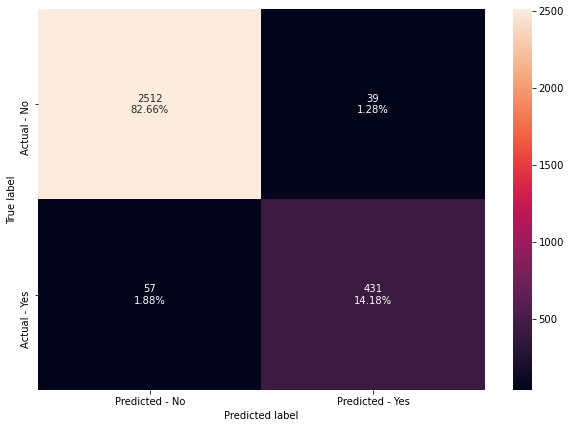

In [428]:
metrics_func(xgbbrand_best_param, X_train_pipe, X_test_pipe, y_train_pipe, y_test_pipe)
conf_matrix(xgbbrand_best_param, X_test_pipe, y_test_pipe)

In [429]:
models = [xgb_best_param, xgbbrand_best_param]
met = []
for i in models:
    met.append(comp_func(i))
    
df_total_scores = pd.DataFrame.from_records(met, columns=['Acc_Train', 'Acc_Test', 'Recall_Train', 'Recall_Test', 'Prec_Train', 'Prec_Test', 'F1_Train', 'F1_Test'], 
                          index = ['GS_ab', 'Random_xgb'])
df_total_scores.sort_values(by='Recall_Test', ascending=False)

,Acc_Train,Acc_Test,Recall_Train,Recall_Test,Prec_Train,Prec_Test,F1_Train,F1_Test
GS_ab,1.0,0.969398,1.0,0.887295,1.0,0.919321,1.0,0.903024
Random_xgb,1.0,0.968411,1.0,0.883197,1.0,0.917021,1.0,0.899791


- The difference in training time is quite striking, 67 seconds compared to 2400 s in our exhaustive search. That is around 2.5 per cent of the time! What is even more interesting, is the fact that out Random Grid Search model performed equally as well and we added several other hyperparamters.
- This model, just as before, achieved an accuracy, recall, precision and logically, F1 score of 100 per cent, showing a certain degree of overfit in the training data. When considering testing data, we notice accuarcy is still quite high at 97 per cent, but recall is reduced to .89 and precision at 92 per cent. Still, we are able to achieve 90 per cent on our F1 Score. Considering this model took only 70 seconds to run, I would consider it a certain success!
- Looking at the actual values of our hyperparameters, we see for the first time that the randomized search used less estimators, 138, than the full search at 160. Learning rate is higher this time at .86 , vs .6. The full search also used 80 per cent of all avilable features while the Random search selected 68 per cent. In the end, both models performed very well, though they both show some signs of overfitting.

# Model Comparison
    We have been comparing each model with the previous implementation in each step, and we have already comented on the differences in running time for exhaustive GridSerach and its Randomized version, however, let us now compare all of the models we have implemented in this section of the project and see which one performed the best!

In [437]:
models = [gb, gd_best_param, gbrand_best_param, adb, ab_best_param, adbrand_best_param, xgb, xgb_best_param, xgbbrand_best_param]
met = []
for i in models:
    met.append(comp_func(i))
    
df_total_scores = pd.DataFrame.from_records(met, columns=['Acc_Train', 'Acc_Test', 'Recall_Train', 'Recall_Test', 'Prec_Train', 'Prec_Test', 'F1_Train', 'F1_Test'], 
                          index = ['Gradient_Boosting', 'Gs_Gradient_Boostin', 'Random_Gradient_Boosting', 'AdaBoost', 'Gs_AdaBoost', 'Random_AdaBoost',
                                  'XGBoost', 'Gs_XGBoost', 'Random_XGBoost'])
df_total_scores.sort_values(by='Recall_Test', ascending=False, inplace = True)

df_total_scores['Execution_Time_S']=[333, 314, 3400, 0, 2484, 67, 172, 0, 0]

df_total_scores

# Note, execution time refers to seconds taken to run Hyperparameter tuning, since the vanilla implementations use default parameters, it takes 0 seconds to run

,Acc_Train,Acc_Test,Recall_Train,Recall_Test,Prec_Train,Prec_Test,F1_Train,F1_Test,Execution_Time_S
Gs_AdaBoost,0.989701,0.971701,0.955224,0.901639,0.980180,0.920502,0.967541,0.910973,333
Random_Gradient_Boosting,1.000000,0.972030,1.000000,0.891393,1.000000,0.931478,1.000000,0.910995,314
Gs_Gradient_Boostin,0.999859,0.970714,1.000000,0.889344,0.999123,0.925373,0.999561,0.907001,3400
XGBoost,1.000000,0.970714,1.000000,0.889344,1.000000,0.925373,1.000000,0.907001,0
Gs_XGBoost,1.000000,0.969398,1.000000,0.887295,1.000000,0.919321,1.000000,0.903024,2484
Random_XGBoost,1.000000,0.968411,1.000000,0.883197,1.000000,0.917021,1.000000,0.899791,67
Random_AdaBoost,0.999577,0.970056,0.999122,0.881148,0.998246,0.928726,0.998684,0.904311,172
AdaBoost,0.964165,0.959197,0.867428,0.860656,0.905591,0.882353,0.886099,0.871369,0
Gradient_Boosting,0.976862,0.962159,0.887621,0.842213,0.965616,0.915367,0.924977,0.877268,0


- The table above shows our top 3 performing models, and three versions of said model. We have the default hyperparamter implementation, the GridSearch and the RandomizedGridSearch. While our top performing model is the exhaustive search for AdaBoost, I believe it important to mention 7 out of 9 models have a Recall score of 89 to 90 per cent, so there not much difference amongst their performance. Likewise, the F1 Score for this top 7 models is between 90 and 91 per cent. The differnece, however, is striking when we take a look at the time it took to look for these optimized hyperparamters. The first 2 models took roughly 5 minutes to run, however, the exhaustive Grid Search for Gradient Boosting took almost and hour to run!
- For a more in depth reviews of each model's performance, please refer back to either Hyperparamter Tuning with GridSearch where I compare default implementation to full GS, or Hyperparamter Tuning with Randoomized Grid Search where I compare each model's GS with RandomizedGS.

# Actionable Insight and Recommendations
- First and foremost we must recommend the best model to implement. Luckily for us, most model perform rather equally and it is down to how long it took to tune their respective hyperparameters. GridSerach (Full) AdaBoost is our top performing model, it also happens to be the model which overfits our data the least and it took a reasonable amount of time to execute its tuning. Of course, it is not as fast to tune as our XGBoost algorithm, which only took over a minute to find its optimal set of hyperpramaters, but at 5 minutes, it is an acceptable price to pay for less overfit, which can be a big problem when implementing solutions in the real world.
- Second important insight gathered from our EDA, there does not seem to be a high degree of difference between Attrited and Current Clients when dividing by categorical values. In fact we, notice the ratios are quite similar when looking at our percentage count plots of Card_Category, Income_Category and Gender. However, it is fair to say customers with a Doctorate degree are somewhat more likely to drop the Credit Card service than other education groups. The company could create a marketing campaign directed specifically at those holding this degree, perhaps offer lower ineterest for research loans and the kind. Likewise, the ratio of females who dropped the service is about 3 percent higher than their male counterparts, so this could be considered when the marketing team is creating a campaign. However, once we combine this information with the feature importance of our models, there are far more pressing characteristics that the bank needs to focus in.
- For example, it is clear that individuals who spend more and use their credit card more frequently, are less likely to become Attrited customers. The bank should find a way to stimulate spending with credit card rather than with debit, and this can be done in several ways. A simple solution would be to offer a reward points program which incites customers to spend more. We could say points increase as the person spends more. We can even go a step ahead and use our logistic classification models to understand how probabilities change as customers spend more. We can state a one percent increase in Average amount per transaction is associated, in avergae, with a 2.7 to 3.5 per cent increase in the probability of staying as a customer in the bank's credit card service.
- From our EDA as well as our tree based models, we can see Total Revolving balance is higher for current customers, so the bank could implement marekting programs where customers are offered more felxible payment schedules so they feel more comfortable carrying debt in their cards. Perhaps lowering interests in credit could help, although a proper cost/benefit analysis should be carried out before implementing this solution.
- The size of transaction is also important and a larger single transaction is associated with a higher probability of being a current customer. Many credit cards set maximum transaction amounts as default, and in order to bypass this feature, one has to call the bank and ask to remove the limit. Since this takes time and effort, many times customers will just pay with their debit card. For this reason, the bank could make the process easier, they could have a limit set option in their online account preferences, or set the limit when the customer first gets their credit card and this could incentivize to use it for larger transactions.
- Customers who who are current credit card holders, also have on average, more services contracted with the bank. This create a sense of loyalty which could be the reason Attrited customers tend to have less relationship counts. However, this is difficult to state since correlation does not automatically imply causation. Nevertheless, offering existing customers new services, such as life and car insurance could help retain them as credit card user. And in fact, this is a technique used in the real world by banks, which is why we sometimes get called with insurance offers. This type of service is specifically used since it is a recurrent charge and not a one off buy, which influences customers to keep their cards.
- Customer age is certainly not a very important feature in our tree based models, and has a low odds coefficient in our logistic regression implementation. Moreover, our EDA shows the average age of both the Attrited and Current Customer cohort to be virtually the same. However, the marketing teams can use this information to contact all customers in the database instead of focusing on a single group, which makes the marketing campaign cheaper as it does not have to be tailored to a specific age bracket!
- Finally, regarding income brackets, some effort should be made to retain customers who earn 120k + dollars a year, since they are the group with the highest ratio of attrited customers. While the difference is quite low, these specific group could be offered credit limits much higher than other income groups. There is always a risk of default, no matter the income, but it is safe to say that a higher income individual is able to pay a higher credit loan compared to other, so perhaps even if they only contract the blue or silver card, they could be offered higher credit limits.
- Combined, these insights about age, transaction expenses, total card uses, age bracket and more, should be able to provide the business with enough information to retain their existing customer (with recommendations based on credit increases, new service offes), and attract new customers (with recommendations marketing campaign targeting).